<a href="https://colab.research.google.com/github/MayerT1/LiDAR_Dev/blob/main/Unified_Branch_Transformer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://chatgpt.com/c/687697b4-1aa0-8005-afa4-c4c7ecc40920

In [1]:
!pip install rasterio geopandas pandas torch torchvision scikit-learn einops

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 32.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 30.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 73.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [4]:
import os

# Define the base project folder and subdirectories
base_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project'
subdirs = [
    'target_data',
    'data',
    'data_NaN_filtered',
    'models',
    'scripts',
    'notebooks',
    'config',
    'results'
]

# Create each subdirectory
for subdir in subdirs:
    path = os.path.join(base_dir, subdir)
    os.makedirs(path, exist_ok=True)
    print(f"Created: {path}")


Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data_NaN_filtered
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/models
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/scripts
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/notebooks
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/config
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results


# filter NaN in Geotiff

In [5]:
import os
import numpy as np
import rasterio

base_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project'
input_dir = os.path.join(base_dir, 'data')
output_dir = os.path.join(base_dir, 'data_NaN_filtered')

def fill_nans_with_mean(input_path, output_path):
    with rasterio.open(input_path) as src:
        profile = src.profile
        data = src.read(1).astype(np.float32)

        nan_mask = np.isnan(data)
        if np.any(nan_mask):
            mean_val = np.nanmean(data)
            data[nan_mask] = mean_val
            print(f"[INFO] Replaced NaNs in {os.path.basename(input_path)} with mean: {mean_val:.4f}")
        else:
            print(f"[INFO] No NaNs in {os.path.basename(input_path)}")

        # Write to new file
        with rasterio.open(output_path, 'w', **profile) as dst:
            dst.write(data, 1)

# Process all GeoTIFFs
for fname in os.listdir(input_dir):
    if fname.lower().endswith('.tif'):
        input_path = os.path.join(input_dir, fname)
        output_path = os.path.join(output_dir, fname)
        fill_nans_with_mean(input_path, output_path)


[INFO] Replaced NaNs in landsat_train_-8586_3519.tif with mean: 0.0418
[INFO] Replaced NaNs in landsat_train_-8586_3520.tif with mean: 0.0502
[INFO] Replaced NaNs in landsat_train_-8586_3521.tif with mean: 0.0445
[INFO] Replaced NaNs in landsat_train_-8586_3522.tif with mean: 0.0425
[INFO] Replaced NaNs in landsat_train_-8586_3523.tif with mean: 0.0691
[INFO] No NaNs in landsat_train_-8587_3514.tif
[INFO] Replaced NaNs in landsat_train_-8587_3512.tif with mean: 0.0620
[INFO] No NaNs in landsat_train_-8587_3516.tif
[INFO] No NaNs in landsat_train_-8587_3518.tif
[INFO] No NaNs in landsat_train_-8587_3521.tif
[INFO] No NaNs in landsat_train_-8587_3522.tif
[INFO] No NaNs in landsat_train_-8587_3523.tif
[INFO] No NaNs in landsat_train_-8587_3515.tif
[INFO] No NaNs in landsat_train_-8588_3512.tif
[INFO] No NaNs in landsat_train_-8588_3513.tif
[INFO] No NaNs in landsat_train_-8588_3514.tif
[INFO] No NaNs in landsat_train_-8588_3516.tif
[INFO] No NaNs in landsat_train_-8588_3517.tif
[INFO] No 

[INFO] No NaNs in dem_train_-8597_3516.tif
[INFO] No NaNs in dem_train_-8597_3517.tif
[INFO] No NaNs in dem_train_-8597_3518.tif
[INFO] No NaNs in dem_train_-8597_3522.tif
[INFO] No NaNs in dem_train_-8597_3523.tif
[INFO] No NaNs in dem_train_-8598_3513.tif
[INFO] No NaNs in dem_train_-8598_3514.tif
[INFO] No NaNs in dem_train_-8598_3519.tif
[INFO] No NaNs in dem_train_-8598_3520.tif
[INFO] No NaNs in dem_train_-8598_3521.tif
[INFO] No NaNs in dem_train_-8598_3522.tif
[INFO] No NaNs in dem_train_-8598_3523.tif
[INFO] No NaNs in dem_train_-8599_3512.tif
[INFO] No NaNs in dem_train_-8599_3516.tif
[INFO] No NaNs in dem_train_-8599_3513.tif
[INFO] No NaNs in dem_train_-8599_3517.tif
[INFO] No NaNs in dem_train_-8599_3518.tif
[INFO] No NaNs in dem_train_-8599_3520.tif
[INFO] No NaNs in dem_train_-8599_3519.tif
[INFO] No NaNs in dem_train_-8599_3522.tif
[INFO] Replaced NaNs in dem_val_-8586_3513.tif with mean: 584.3411
[INFO] No NaNs in dem_train_-8599_3523.tif
[INFO] No NaNs in dem_val_-858

# Map

In [6]:
import os
import folium
import rasterio
from rasterio.warp import transform_bounds
from glob import glob
from shapely.geometry import box, Point, mapping
import geopandas as gpd
import pandas as pd

# ----------------- CONFIG -----------------
RASTER_DIR = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data_NaN_filtered'
GEDI_CSV = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data/filtered_csvs/GEDI_filtered_merged.csv'

COVARIATE_COLORS = {
    'dem': 'gray',
    'ls': 'green',
    'ndvi': 'purple',
    'savi': 'blue',
    'evi': 'orange',
    'slope': 'red',
    'aspect': 'brown',
    'elevation': 'black',
    'default': 'pink'
}

# ----------------- Load GEDI Targets -----------------
gedi_df = pd.read_csv(GEDI_CSV)

lat_col_candidates = ['latitude', 'lat', 'y']
lon_col_candidates = ['longitude', 'lon', 'x']

lat_col = next((col for col in lat_col_candidates if col in gedi_df.columns), None)
lon_col = next((col for col in lon_col_candidates if col in gedi_df.columns), None)

if not lat_col or not lon_col:
    raise ValueError(f"Latitude/Longitude columns not found. Expected one of {lat_col_candidates} and {lon_col_candidates}")

gedi_gdf = gpd.GeoDataFrame(
    gedi_df,
    geometry=gpd.points_from_xy(gedi_df[lon_col], gedi_df[lat_col]),
    crs='EPSG:4326'
)

# Create square buffer (~25m = ~0.000225 degrees at equator)
gedi_gdf['geometry'] = gedi_gdf.geometry.buffer(0.000225, cap_style=3)
gedi_gdf['block_id'] = gedi_gdf['geometry'].centroid.apply(lambda pt: f"{int(pt.x*1e4)}_{int(pt.y*1e4)}")

# ----------------- Load Raster Bounds -----------------
tif_files = glob(os.path.join(RASTER_DIR, '**/*.tif'), recursive=True)

raster_records = []
for tif in tif_files:
    try:
        with rasterio.open(tif) as src:
            bounds = transform_bounds(src.crs, 'EPSG:4326', *src.bounds)
            cov = next((c for c in COVARIATE_COLORS if c in tif.lower()), 'default')
            color = COVARIATE_COLORS[cov]
            geom = box(*bounds)
            block_id = os.path.basename(tif).split('_')[-1].replace('.tif', '')
            raster_records.append({
                'geometry': geom,
                'block_id': block_id,
                'covariate': cov,
                'resolution': src.res[0],
                'color': color,
                'filename': os.path.basename(tif)
            })
    except Exception as e:
        print(f"[WARN] Skipping {tif}: {e}")

raster_gdf = gpd.GeoDataFrame(raster_records, crs='EPSG:4326')

#----------------- Initialize Map -----------------
center = gedi_gdf.geometry.unary_union.centroid
m = folium.Map(location=[center.y, center.x], zoom_start=13, tiles="CartoDB positron")

# ----------------- Add GEDI Layer -----------------
for _, row in gedi_gdf.iterrows():
    coords = list(mapping(row.geometry)['coordinates'][0])
    folium.Polygon(
        locations=[(lat, lon) for lon, lat in coords],
        color='cyan',
        fill=True,
        fill_opacity=0.4,
        tooltip=f"<b>GEDI</b><br>Block: {row['block_id']}"
    ).add_to(m)

# ----------------- Add Raster Layers (Grouped by Covariate) -----------------
for covariate in raster_gdf['covariate'].unique():
    sub_gdf = raster_gdf[raster_gdf['covariate'] == covariate]
    for _, row in sub_gdf.iterrows():
        coords = list(mapping(row.geometry)['coordinates'][0])
        folium.Polygon(
            locations=[(lat, lon) for lon, lat in coords],
            color=row['color'],
            weight=1,
            fill=True,
            fill_opacity=0.2,
            tooltip=f"""
                <b>{covariate.upper()}</b><br>
                Block ID: {row['block_id']}<br>
                Resolution: {row['resolution']}<br>
                File: {row['filename']}
            """
        ).add_to(m)

# ----------------- Show Map -----------------
m


/tmp/ipython-input-6-2216807254.py:45: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gedi_gdf['geometry'] = gedi_gdf.geometry.buffer(0.000225, cap_style=3)
/tmp/ipython-input-6-2216807254.py:46: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gedi_gdf['block_id'] = gedi_gdf['geometry'].centroid.apply(lambda pt: f"{int(pt.x*1e4)}_{int(pt.y*1e4)}")
/tmp/ipython-input-6-2216807254.py:74: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  center = gedi_gdf.geometry.unary_union.centroid


In [7]:
raster_gdf

,geometry,block_id,covariate,resolution,color,filename
0,"POLYGON ((-85.8567 35.19413, -85.8567 35.19714...",3519,default,30.0,pink,landsat_train_-8586_3519.tif
1,"POLYGON ((-85.85691 35.20197, -85.85691 35.205...",3520,default,30.0,pink,landsat_train_-8586_3520.tif
2,"POLYGON ((-85.85642 35.2136, -85.85642 35.2168...",3521,default,30.0,pink,landsat_train_-8586_3521.tif
3,"POLYGON ((-85.85662 35.2228, -85.85662 35.2260...",3522,default,30.0,pink,landsat_train_-8586_3522.tif
4,"POLYGON ((-85.85683 35.23119, -85.85683 35.234...",3523,default,30.0,pink,landsat_train_-8586_3523.tif
...,...,...,...,...,...,...
1336,"POLYGON ((-85.85696 35.12786, -85.85696 35.131...",3512,default,30.0,pink,landsat_train_-8586_3512.tif
1337,"POLYGON ((-85.85674 35.14382, -85.85674 35.147...",3514,default,30.0,pink,landsat_train_-8586_3514.tif
1338,"POLYGON ((-85.85661 35.15274, -85.85661 35.156...",3515,default,30.0,pink,landsat_train_-8586_3515.tif
1339,"POLYGON ((-85.85697 35.17438, -85.85697 35.177...",3517,default,30.0,pink,landsat_train_-8586_3517.tif


Average GEDI values per 32x32 block

In [8]:
# ----------------- Ensure Same CRS -----------------
gedi_gdf = gedi_gdf.to_crs('EPSG:4326')
raster_gdf = raster_gdf.to_crs('EPSG:4326')

# ----------------- Spatial Join -----------------
# Each GEDI point gets linked to overlapping raster tile
joined = gpd.sjoin(gedi_gdf, raster_gdf, how='inner', predicate='intersects')

# ----------------- Compute Per-Tile Averages -----------------
target_cols = ['pai', 'fhd_normal', 'rh100']

# Check original target columns exist
for col in target_cols:
    if col not in joined.columns:
        raise ValueError(f"Missing required column '{col}' in joined GeoDataFrame")

# Group by raster polygon index and compute averages
avg_df = (
    joined
    .groupby('index_right')[target_cols]
    .mean()
    .rename(columns={
        'pai': 'avg_pai',
        'fhd_normal': 'avg_fhd_normal',
        'rh100': 'avg_rh100'
    })
    .reset_index()
)

# ----------------- Merge Averages with Raster Polygons -----------------
# Reset index to get 'index_right' for joining
raster_meta = raster_gdf.reset_index().rename(columns={'index': 'index_right'})

# Merge averages onto raster polygons
raster_with_avg = raster_meta.merge(avg_df, on='index_right', how='left')

# ----------------- Finalize Output -----------------
# raster_with_avg is a GeoDataFrame with one polygon per raster tile,
# and averaged GEDI target values per polygon.

# Select relevant columns (add more if needed)
final_cols = [
    'geometry', 'block_id', 'covariate', 'filename', 'resolution',
    'avg_pai', 'avg_fhd_normal', 'avg_rh100'
]

final_df = raster_with_avg[final_cols].copy()

# ----------------- Output -----------------
print("✅ Final raster polygons with averaged GEDI target values:")
print(final_df.head())
print(f"\n✅ Total raster polygons with GEDI data: {len(final_df)}")


✅ Final raster polygons with averaged GEDI target values:
                                            geometry block_id covariate  \
0  POLYGON ((-85.8567 35.19413, -85.8567 35.19714...     3519   default   
1  POLYGON ((-85.85691 35.20197, -85.85691 35.205...     3520   default   
2  POLYGON ((-85.85642 35.2136, -85.85642 35.2168...     3521   default   
3  POLYGON ((-85.85662 35.2228, -85.85662 35.2260...     3522   default   
4  POLYGON ((-85.85683 35.23119, -85.85683 35.234...     3523   default   

                       filename  resolution   avg_pai  avg_fhd_normal  \
0  landsat_train_-8586_3519.tif        30.0  3.609207        3.223214   
1  landsat_train_-8586_3520.tif        30.0  3.777873        3.306463   
2  landsat_train_-8586_3521.tif        30.0  4.031756        3.072752   
3  landsat_train_-8586_3522.tif        30.0  2.046263        2.700620   
4  landsat_train_-8586_3523.tif        30.0  1.829600        2.199521   

     avg_rh100  
0  2811.500000  
1  3096.666667  
2

In [9]:
for col in final_df.columns:
    print(col)


geometry
block_id
covariate
filename
resolution
avg_pai
avg_fhd_normal
avg_rh100


In [10]:
# final_df

avg_target_df = final_df.dropna()

avg_target_df


,geometry,block_id,covariate,filename,resolution,avg_pai,avg_fhd_normal,avg_rh100
0,"POLYGON ((-85.8567 35.19413, -85.8567 35.19714...",3519,default,landsat_train_-8586_3519.tif,30.0,3.609207,3.223214,2811.500000
1,"POLYGON ((-85.85691 35.20197, -85.85691 35.205...",3520,default,landsat_train_-8586_3520.tif,30.0,3.777873,3.306463,3096.666667
2,"POLYGON ((-85.85642 35.2136, -85.85642 35.2168...",3521,default,landsat_train_-8586_3521.tif,30.0,4.031756,3.072752,2577.750000
3,"POLYGON ((-85.85662 35.2228, -85.85662 35.2260...",3522,default,landsat_train_-8586_3522.tif,30.0,2.046263,2.700620,1849.133333
4,"POLYGON ((-85.85683 35.23119, -85.85683 35.234...",3523,default,landsat_train_-8586_3523.tif,30.0,1.829600,2.199521,1414.666667
...,...,...,...,...,...,...,...,...
1336,"POLYGON ((-85.85696 35.12786, -85.85696 35.131...",3512,default,landsat_train_-8586_3512.tif,30.0,2.502094,2.901717,2137.625000
1337,"POLYGON ((-85.85674 35.14382, -85.85674 35.147...",3514,default,landsat_train_-8586_3514.tif,30.0,1.815060,2.136579,1339.500000
1338,"POLYGON ((-85.85661 35.15274, -85.85661 35.156...",3515,default,landsat_train_-8586_3515.tif,30.0,3.803749,3.289859,3021.333333
1339,"POLYGON ((-85.85697 35.17438, -85.85697 35.177...",3517,default,landsat_train_-8586_3517.tif,30.0,2.222445,2.755105,2205.333333


In [11]:
# # Make sure the directory exists and save the DataFrame
# save_path = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data/filtered_csvs/avg_target_df.csv'
# avg_target_df.to_csv(save_path, index=False)


transformer

In [12]:
eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']

spatial_res = {
    's1': 10, 's2': 20, 's2_idx': 20,
    'landsat': 30, 'landsat_idx': 30, 'hls': 30,
    'tcap': 30, 'dem': 30
}

bands_per_cov = {
    's1': 4, 's2': 6, 's2_idx': 8,
    'landsat': 6, 'landsat_idx': 7, 'hls': 7,
    'tcap': 6, 'dem': 2
}


In [9]:
# # Number of channels per EO
# eo_channels = {
#     's1': 4,
#     's2': 6,
#     'landsat': 6,
#     'landsat_idx': 7,
#     'hls': 7,
#     'tcap': 6,
#     'dem': 2,
#     's2_idx': 8,
# }

# # Patch embedders (per EO)
# patch_embedders = {
#     eo: PatchEmbedder(in_channels=eo_channels[eo], patch_size=16, embed_dim=64).to(device)
#     for eo in eo_list
# }


# Unifed code for all Vit Branch dev

In [46]:
data_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data_NaN_filtered'


[INFO] Processing EO product: s1
[INFO] TRAIN s1 dataset initialized with 105 tiles
[INFO] VAL s1 dataset initialized with 25 tiles
[INFO] Extracted 22 clean embeddings


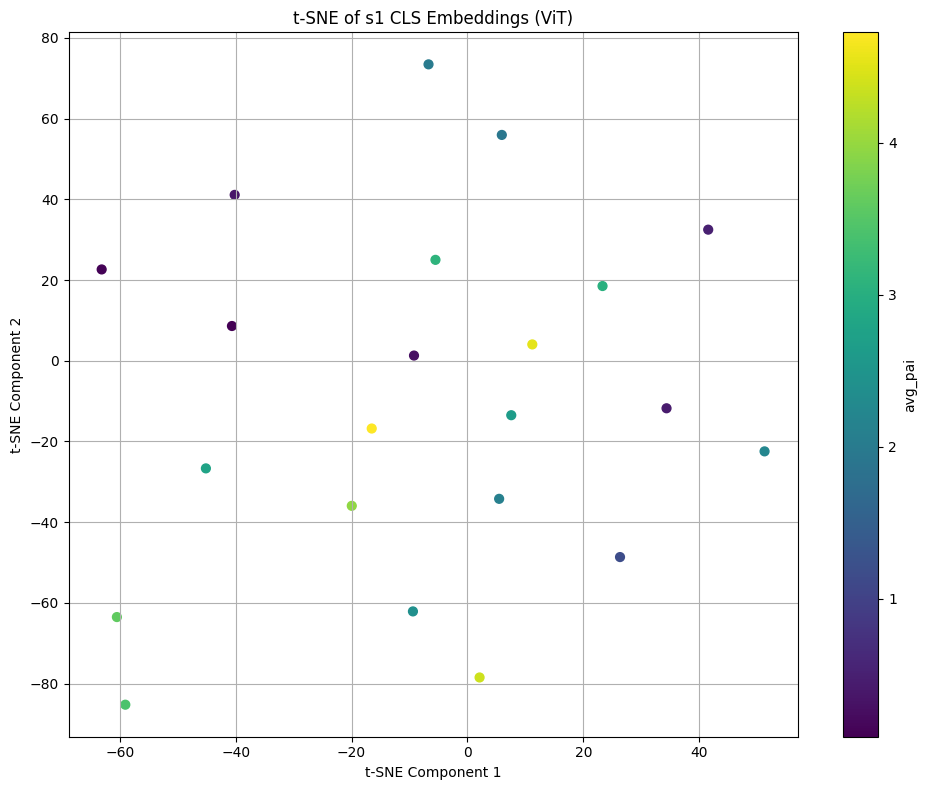

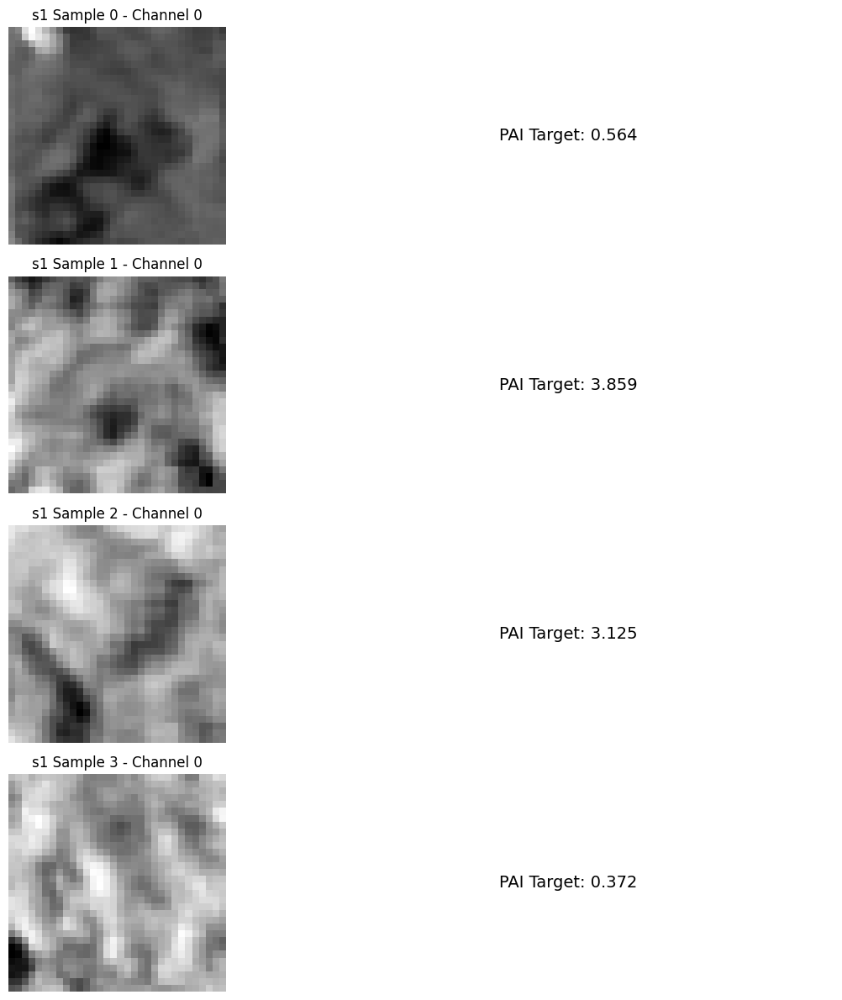


[INFO] Processing EO product: s2
[INFO] TRAIN s2 dataset initialized with 106 tiles
[INFO] VAL s2 dataset initialized with 26 tiles
[INFO] Extracted 24 clean embeddings


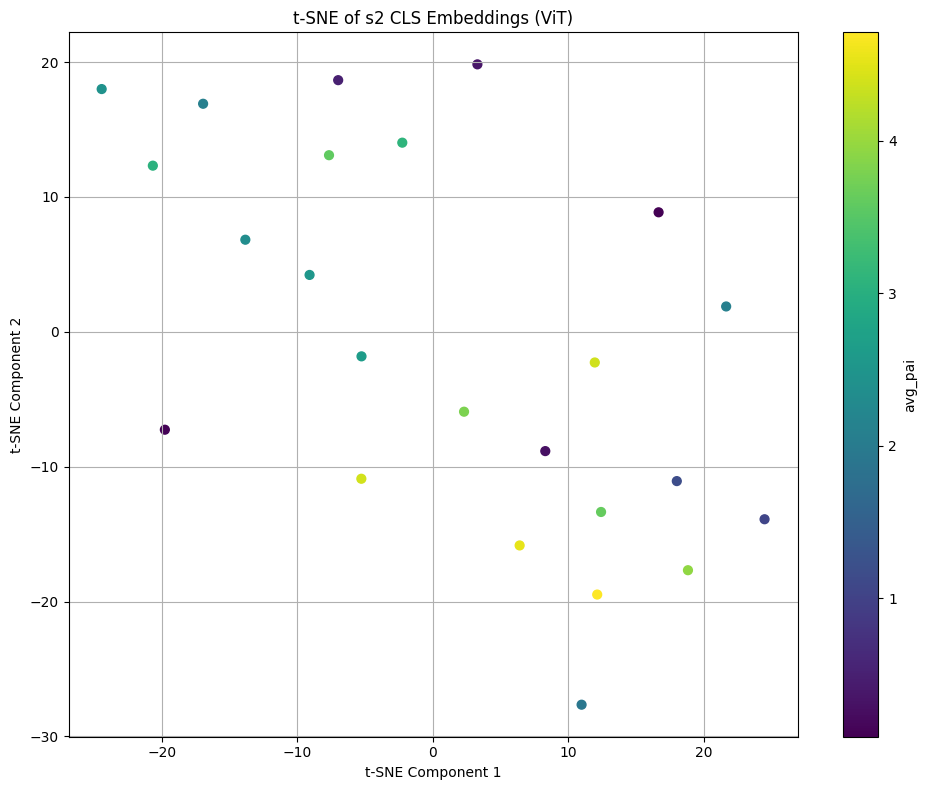

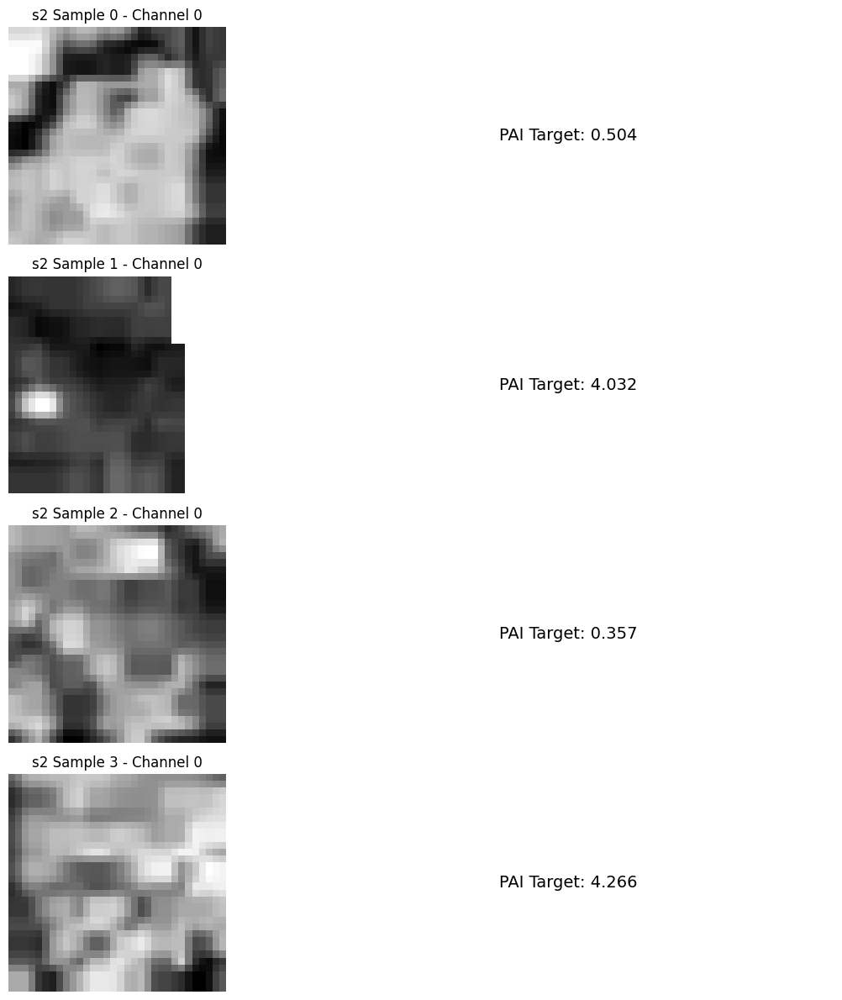


[INFO] Processing EO product: landsat
[INFO] TRAIN landsat dataset initialized with 105 tiles
[INFO] VAL landsat dataset initialized with 25 tiles
[INFO] Extracted 23 clean embeddings


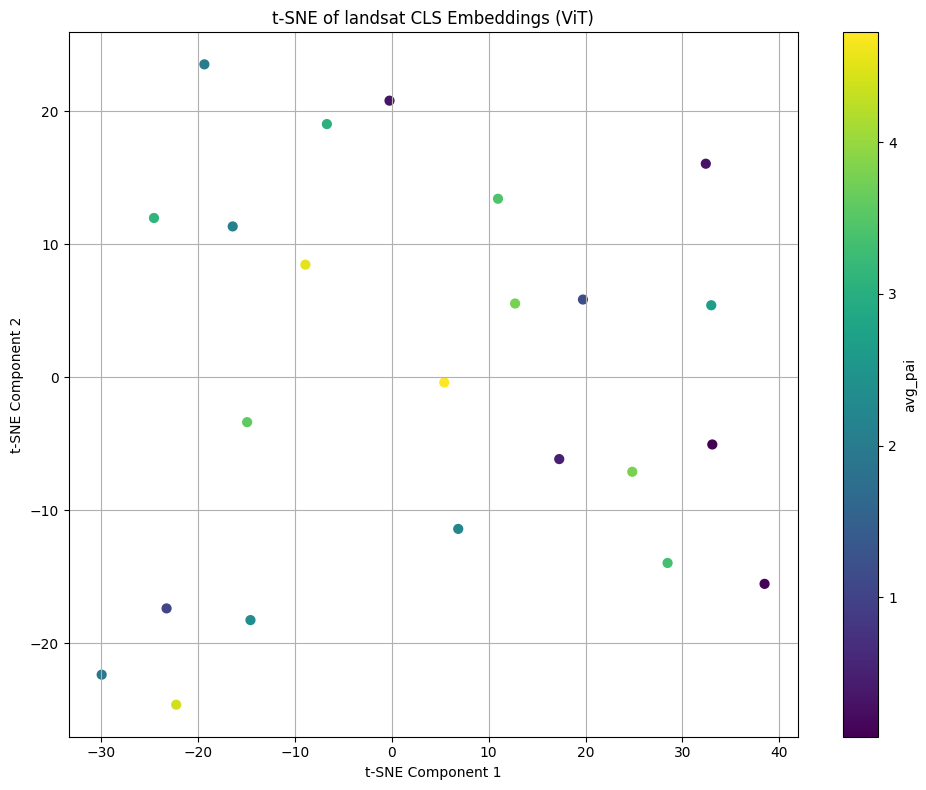

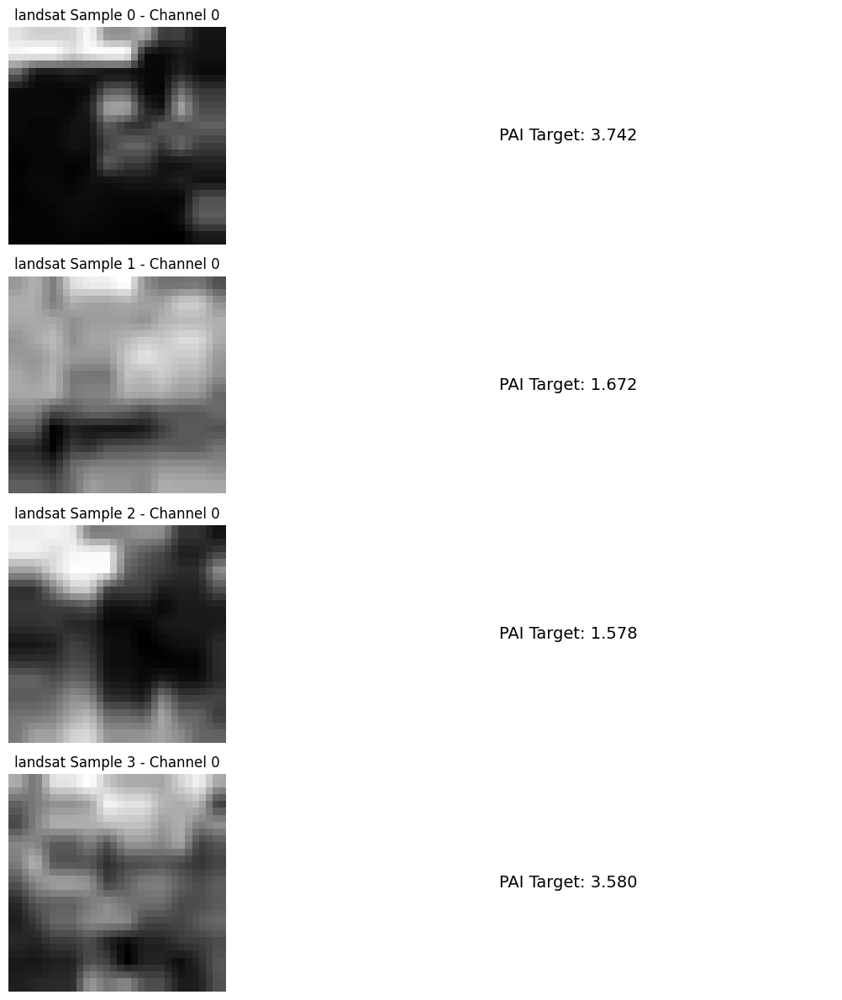


[INFO] Processing EO product: landsat_idx
[INFO] TRAIN landsat_idx dataset initialized with 104 tiles
[INFO] VAL landsat_idx dataset initialized with 25 tiles
[INFO] Extracted 23 clean embeddings


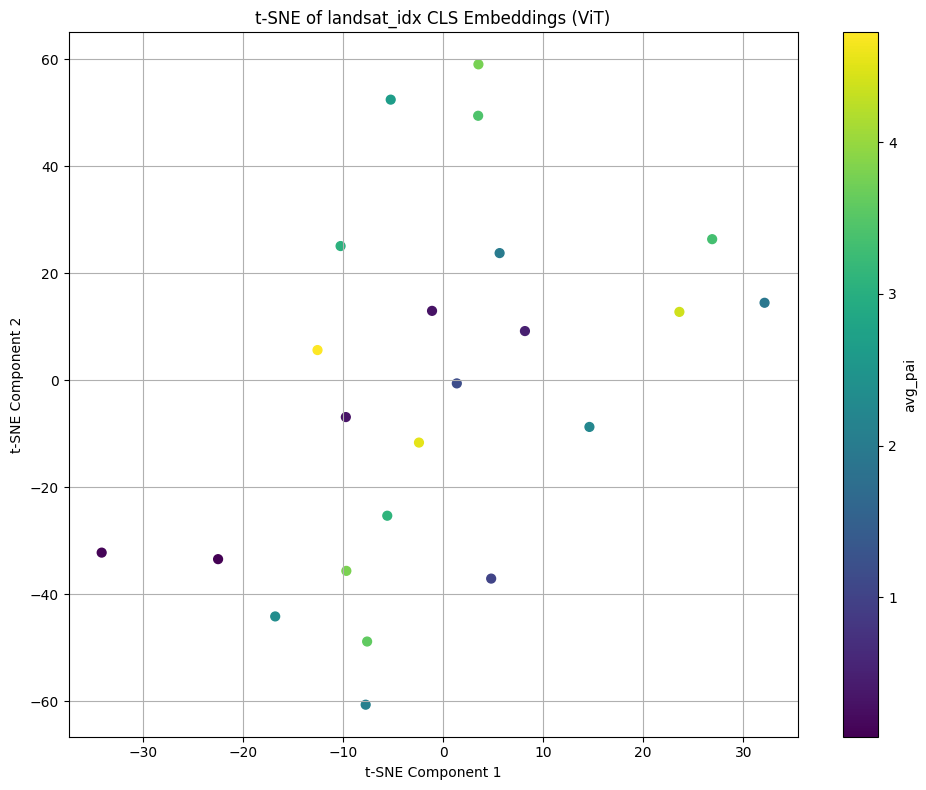

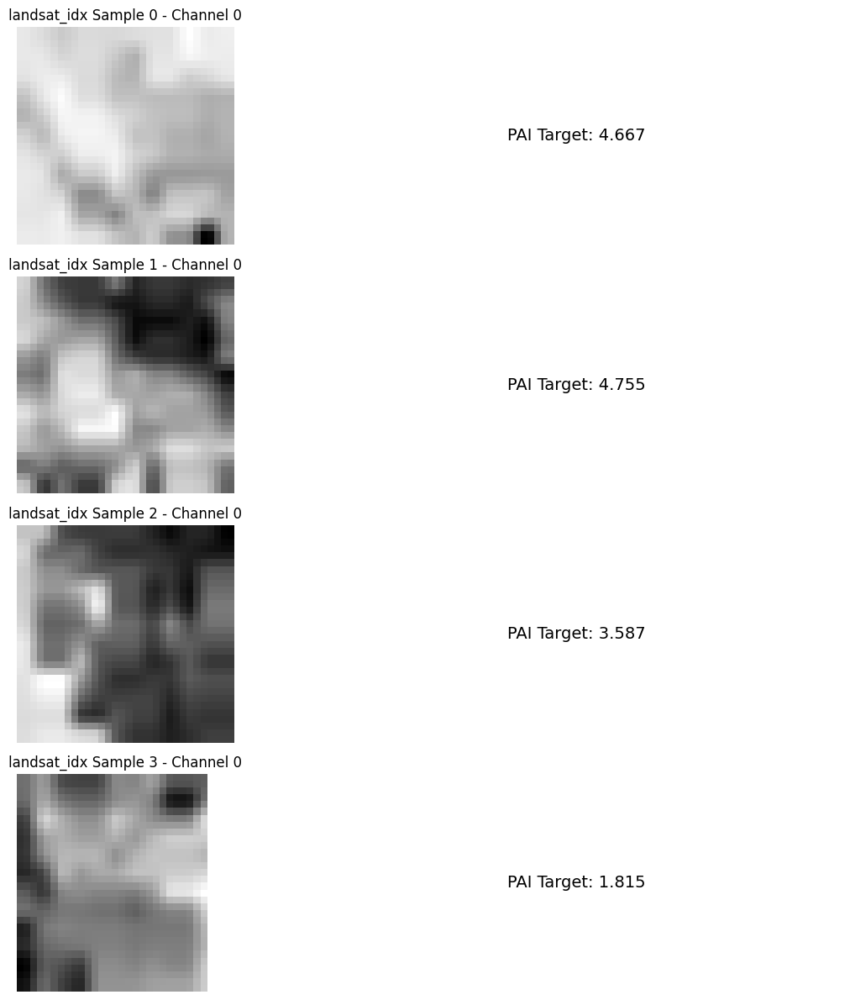


[INFO] Processing EO product: hls
[INFO] TRAIN hls dataset initialized with 105 tiles
[INFO] VAL hls dataset initialized with 25 tiles
[INFO] Extracted 22 clean embeddings


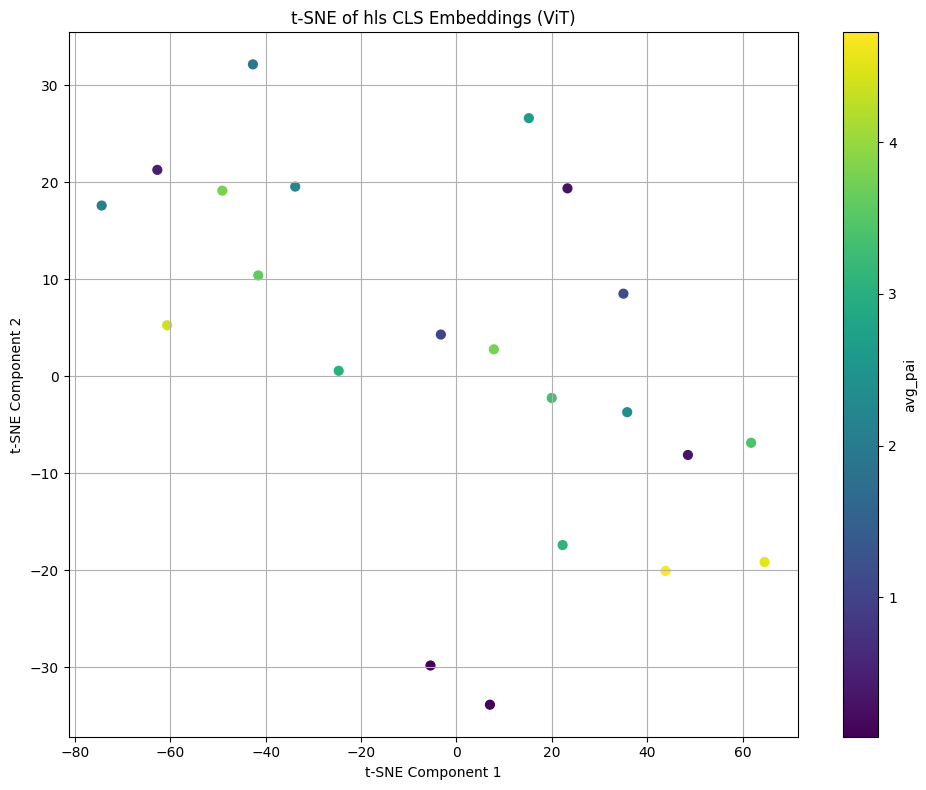

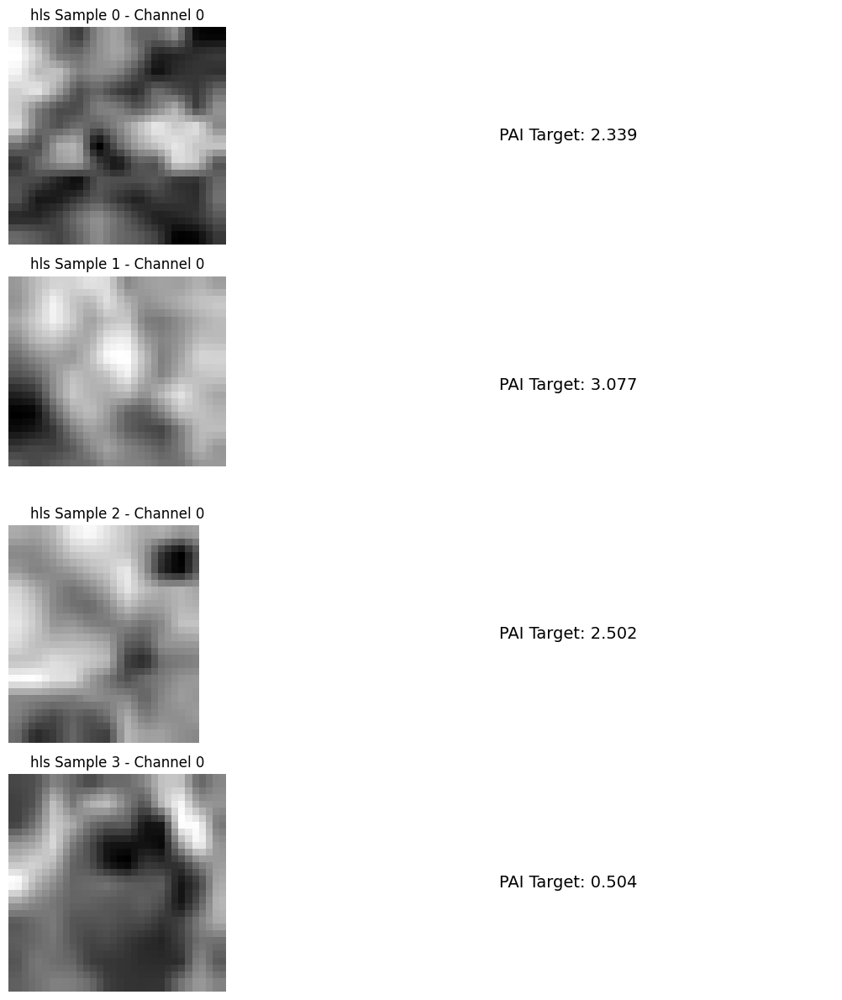


[INFO] Processing EO product: tcap
[INFO] TRAIN tcap dataset initialized with 105 tiles
[INFO] VAL tcap dataset initialized with 25 tiles
[INFO] Extracted 23 clean embeddings


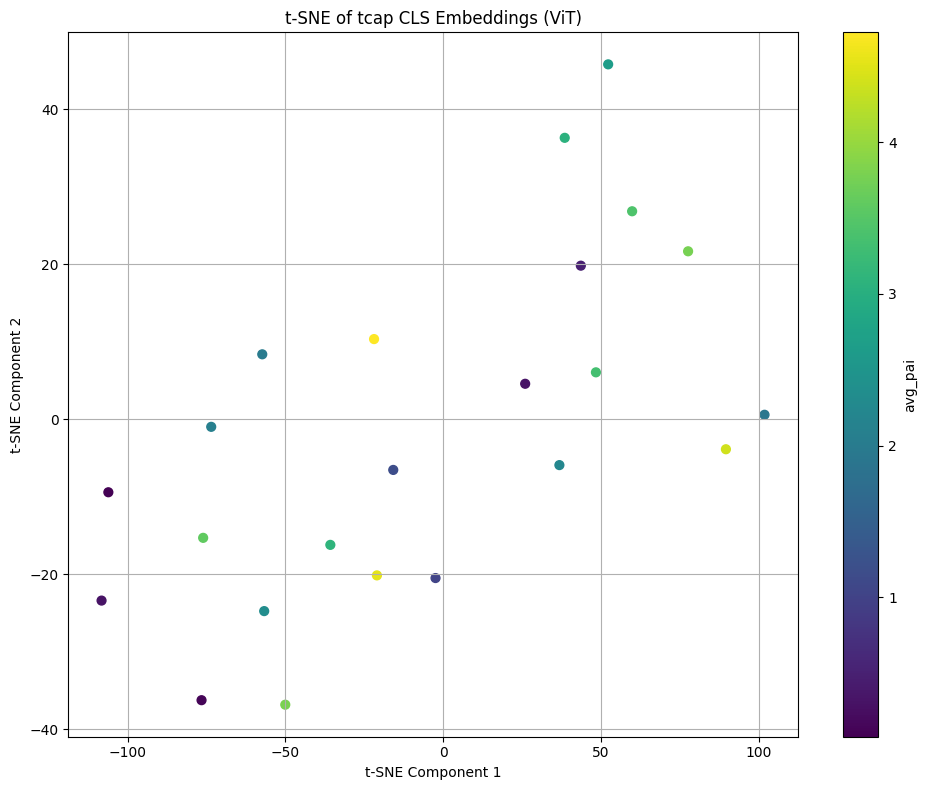

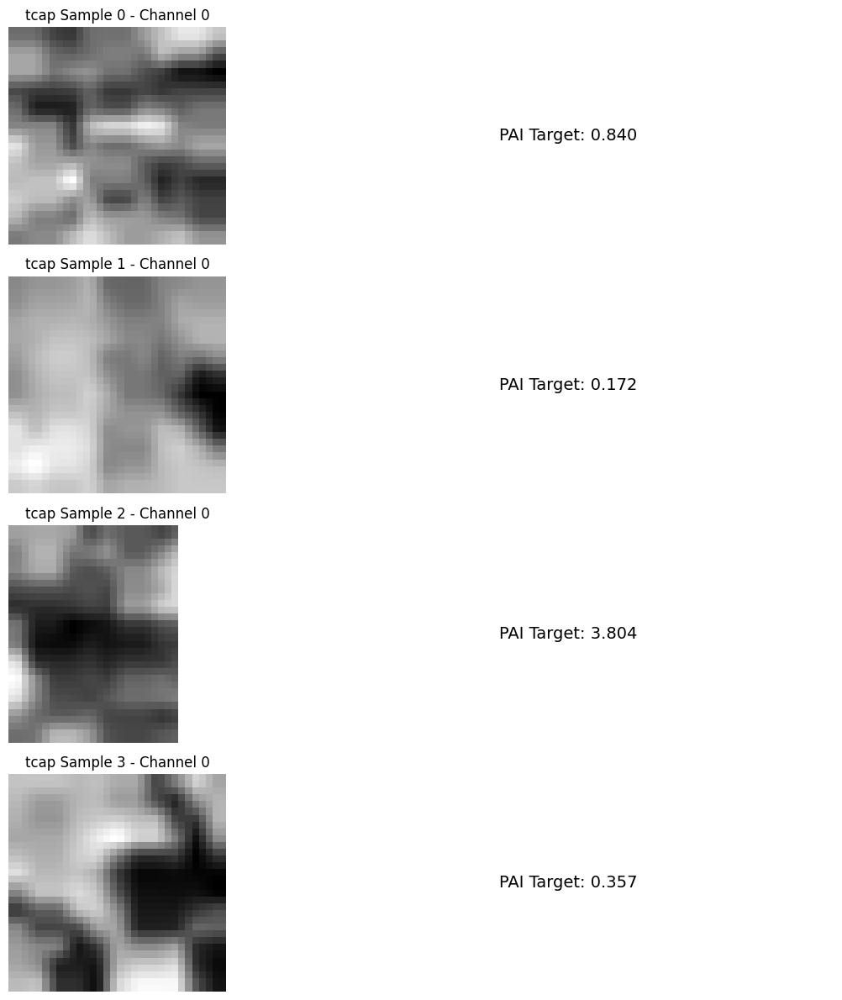


[INFO] Processing EO product: dem
[INFO] TRAIN dem dataset initialized with 112 tiles
[INFO] VAL dem dataset initialized with 26 tiles
[INFO] Extracted 24 clean embeddings


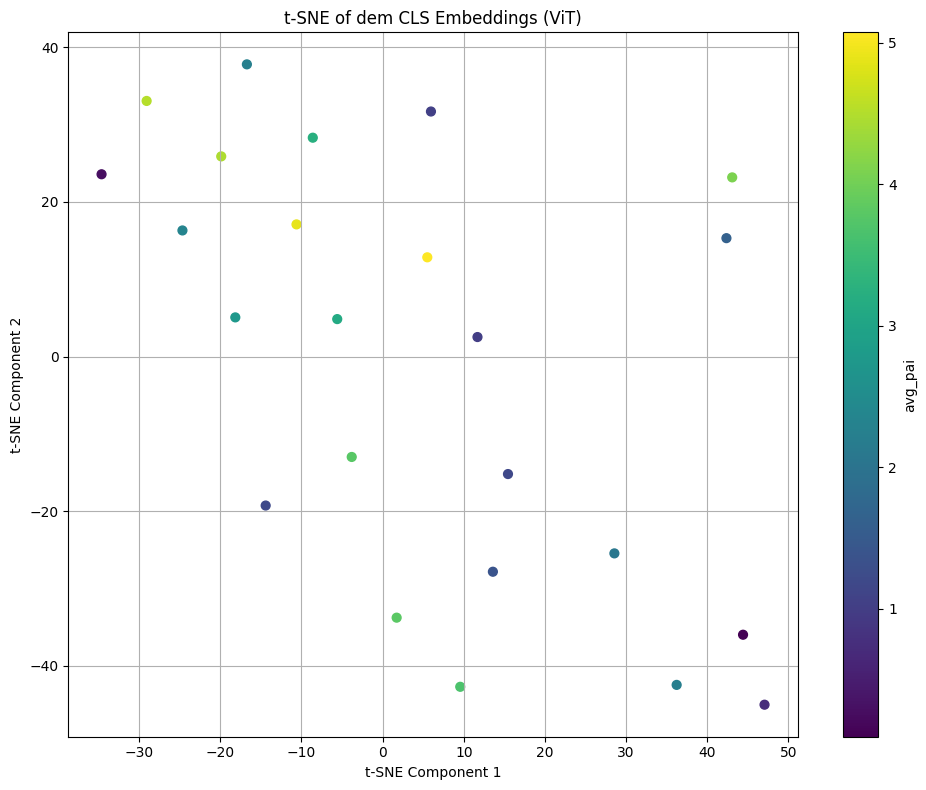

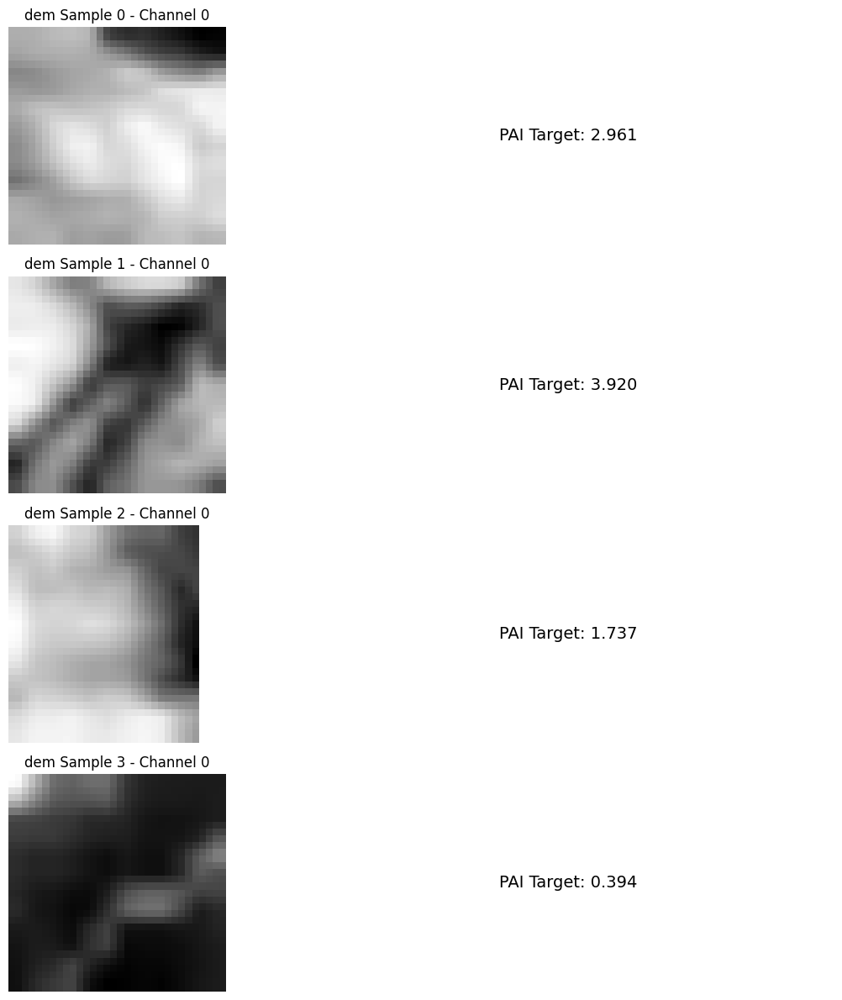


[INFO] Processing EO product: s2_idx
[INFO] TRAIN s2_idx dataset initialized with 106 tiles
[INFO] VAL s2_idx dataset initialized with 26 tiles
[INFO] Extracted 24 clean embeddings


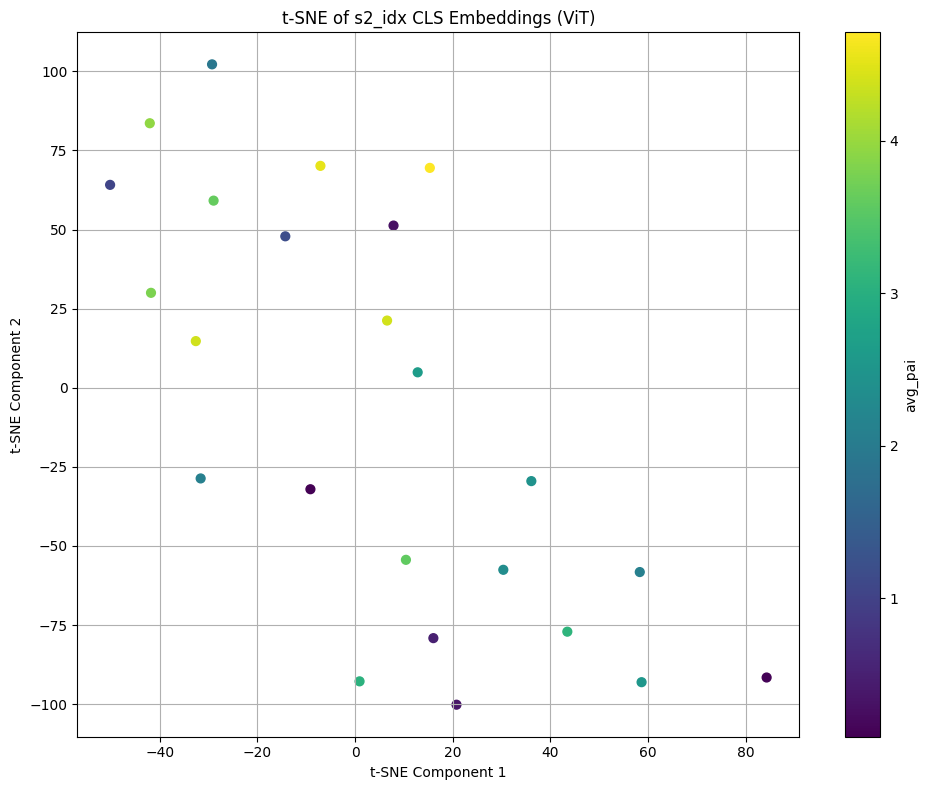

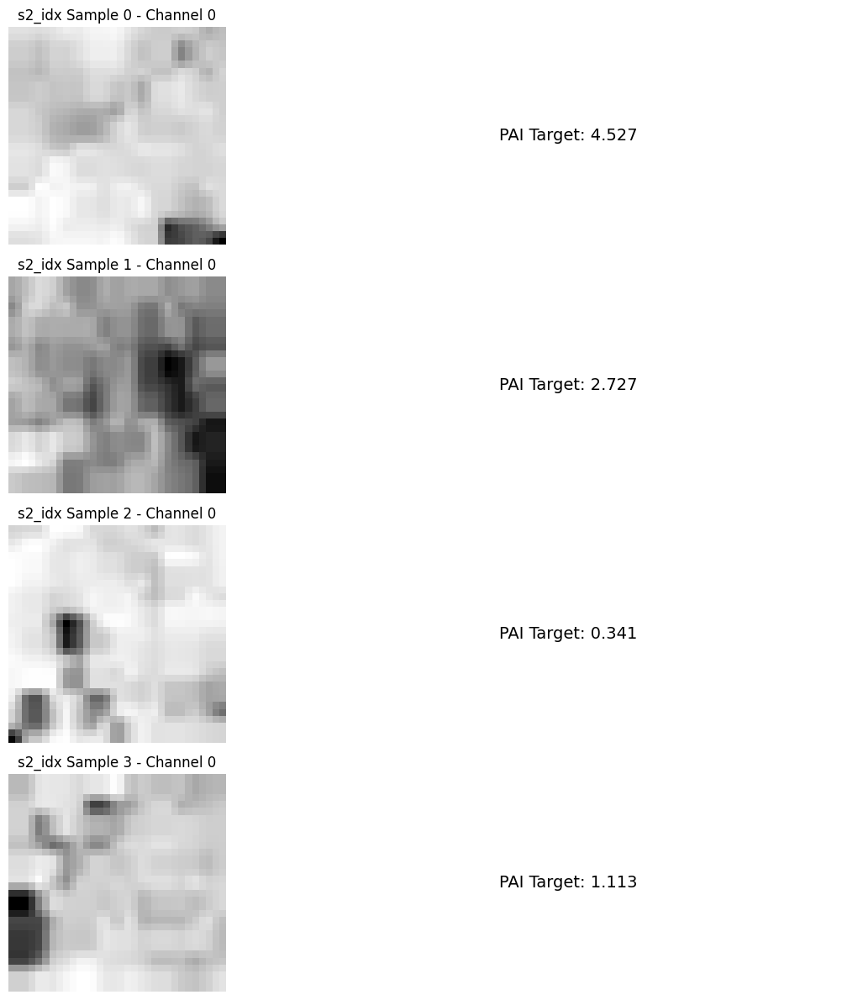

In [64]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE

# # Configs
# eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']
# spatial_res = {
#     's1': 10, 's2': 20, 's2_idx': 20,
#     'landsat': 30, 'landsat_idx': 30, 'hls': 30,
#     'tcap': 30, 'dem': 30
# }
# bands_per_cov = {
#     's1': 4, 's2': 6, 's2_idx': 8,
#     'landsat': 6, 'landsat_idx': 7, 'hls': 7,
#     'tcap': 6, 'dem': 2
# }

# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# # --- Generic EO Dataset ---
# class EODataset(Dataset):
#     def __init__(self, eo_name, data_dir, split, target_df, patch_size=32):
#         self.eo_name = eo_name
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"{eo_name}_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split.upper()} {eo_name} dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_resize_patch(self, filepath):
#         with rasterio.open(filepath) as src:
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )
#         return torch.from_numpy(array_resized).float()

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_resize_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor


# # --- Generic EO ViT Model ---
# class EOViT(nn.Module):
#     def __init__(self, in_channels, patch_size=16, emb_dim=64, num_heads=4, num_layers=2, patch_dim=32):
#         super().__init__()
#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         num_patches = (patch_dim // patch_size) ** 2
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, num_patches + 1, emb_dim))
#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
#         self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

#     def forward(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)  # (B, N, emb_dim)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return self.mlp_head(x[:, 0]).squeeze(1)

#     def extract_cls_embeddings(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]  # CLS token embeddings


# # --- Extract embeddings for an EO product ---
# def extract_embeddings_and_targets(model, dataloader, device):
#     model.eval()
#     all_embeddings, all_targets = [], []
#     with torch.no_grad():
#         for x, y in dataloader:
#             x = x.to(device)
#             embeddings = model.extract_cls_embeddings(x).detach().cpu()
#             all_embeddings.append(embeddings)
#             all_targets.append(y)
#     embeddings = torch.cat(all_embeddings).numpy()
#     targets = torch.cat(all_targets).numpy()
#     mask = ~np.isnan(embeddings).any(axis=1)
#     print(f"[INFO] Extracted {mask.sum()} clean embeddings")
#     return embeddings[mask], targets[mask]


# # --- Visualize t-SNE for one EO ---
# def visualize_tsne(embeddings, targets, eo_name, perplexity=30):
#     n_samples = embeddings.shape[0]
#     perplexity = min(perplexity, max(5, n_samples // 3))
#     tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, method='exact')
#     reduced = tsne.fit_transform(embeddings)
#     plt.figure(figsize=(10, 8))
#     scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=targets, cmap='viridis', s=40)
#     plt.colorbar(scatter, label='avg_pai')
#     plt.title(f't-SNE of {eo_name} CLS Embeddings (ViT)')
#     plt.xlabel('t-SNE Component 1')
#     plt.ylabel('t-SNE Component 2')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()


# # --- Visualize sample images and targets from a dataloader ---
# def visualize_samples(dataloader, eo_name, num_samples=4):
#     images, targets = next(iter(dataloader))
#     plt.figure(figsize=(12, 3 * num_samples))
#     for i in range(num_samples):
#         img = images[i].cpu().numpy()  # shape [C, H, W]
#         pai = targets[i].item()

#         img_channel = img[0]  # visualize first channel for simplicity

#         plt.subplot(num_samples, 2, 2 * i + 1)
#         plt.imshow(img_channel, cmap='gray')
#         plt.title(f"{eo_name} Sample {i} - Channel 0")
#         plt.axis('off')

#         plt.subplot(num_samples, 2, 2 * i + 2)
#         plt.text(0.5, 0.5, f"PAI Target: {pai:.3f}", fontsize=14, ha='center', va='center')
#         plt.axis('off')

#     plt.tight_layout()
#     plt.show()


# # --- Main orchestration ---
# def main_pipeline(data_root_dir, avg_target_df, patch_size=32, batch_size=8):
#     embedding_dict = {}
#     dataloader_dict = {}
#     model_dict = {}

#     for eo in eo_list:
#         print(f"\n[INFO] Processing EO product: {eo}")

#         # Filter target_df for this EO and each split
#         train_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_train_')]
#         val_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_val_')]
#         test_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_test_')]

#         # Setup datasets and dataloaders (train only here for visualization)
#         train_dataset = EODataset(eo, data_root_dir, 'train', train_df, patch_size=patch_size)
#         val_dataset = EODataset(eo, data_root_dir, 'val', val_df, patch_size=patch_size)

#         train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#         val_loader = DataLoader(val_dataset, batch_size=batch_size)

#         dataloader_dict[eo] = {'train': train_loader, 'val': val_loader}

#         # Instantiate ViT model for EO
#         model = EOViT(in_channels=bands_per_cov[eo], patch_size=16, emb_dim=64, patch_dim=patch_size).to(device)
#         model_dict[eo] = model

#         # Extract embeddings on validation set for t-SNE
#         embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
#         embedding_dict[eo] = {'embeddings': embeddings, 'targets': targets}

#         # Visualize t-SNE for this EO
#         visualize_tsne(embeddings, targets, eo)

#         # Visualize some train samples with targets
#         visualize_samples(train_loader, eo)

#     return embedding_dict, dataloader_dict, model_dict


# # === Usage ===
# data_root_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data'
# avg_target_df
# embedding_dict, dataloader_dict, model_dict = main_pipeline(data_root_dir, avg_target_df)


Fusion appaorch

In [65]:
# embedding_dict

{'s1': {'embeddings': array([[-0.7150794 ,  1.0559759 , -1.2246394 , ...,  0.07620872,
           0.56197697, -0.6408226 ],
         [-0.73878103,  1.0561712 , -1.2014146 , ...,  0.03211256,
           0.49352312, -0.59689254],
         [-0.72062635,  0.9948292 , -1.202512  , ...,  0.07371208,
           0.5818186 , -0.64587843],
         ...,
         [-0.75115156,  1.0618112 , -1.2382917 , ...,  0.09925567,
           0.48075745, -0.62417483],
         [-0.69460523,  1.0690061 , -1.2396982 , ...,  0.08167982,
           0.52592176, -0.59122527],
         [-0.71683097,  1.0257593 , -1.2322185 , ...,  0.01080185,
           0.5535367 , -0.56831306]], dtype=float32),
  'targets': array([4.5393934 , 3.096212  , 3.0381982 , 2.782471  , 4.3806767 ,
         0.3472858 , 2.6318781 , 2.002462  , 0.5071922 , 2.0887268 ,
         3.5903184 , 2.407145  , 2.2239034 , 4.7247057 , 0.43416214,
         0.12371969, 1.9222094 , 0.29163796, 3.419378  , 0.09393962,
         3.9520385 , 1.1669382 ], dtyp

viz cross all embedding

/tmp/ipython-input-54-1881052632.py:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


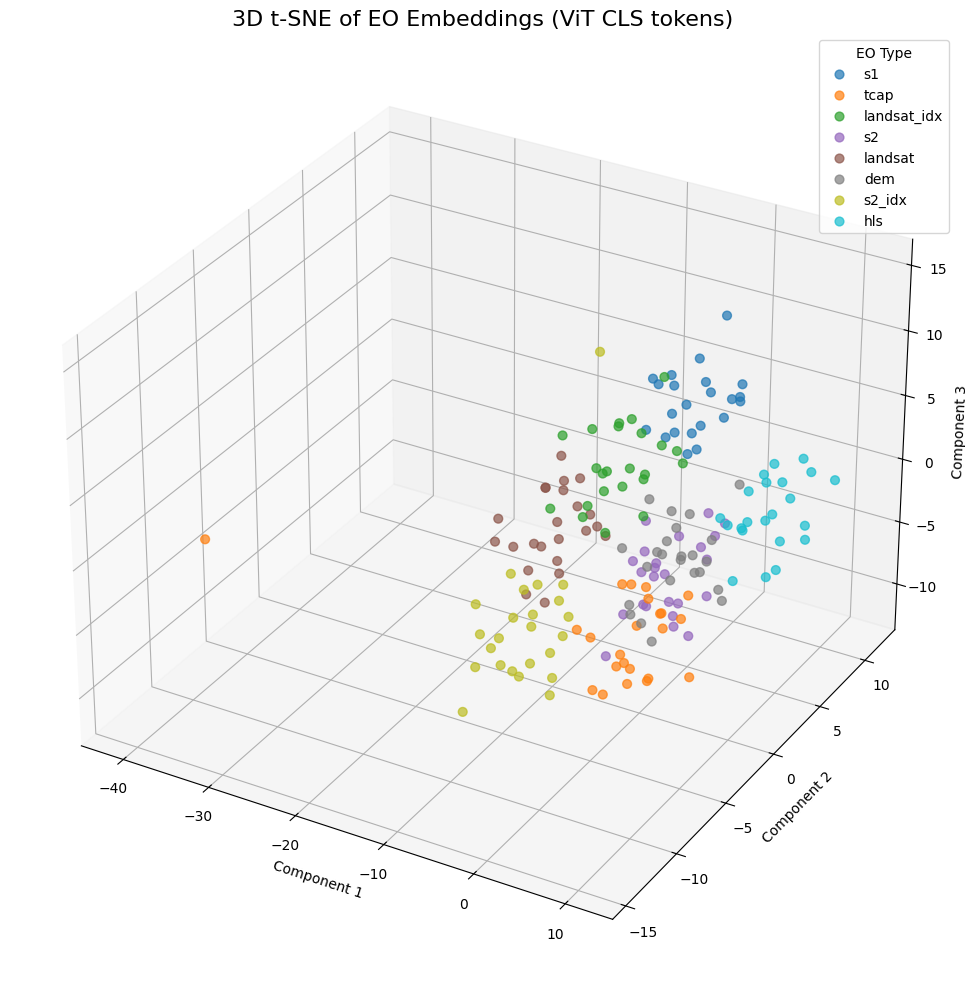

In [54]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE
# from mpl_toolkits.mplot3d import Axes3D

# def visualize_tsne_all_embeddings_3d(embedding_dict, sample_limit=1000, perplexity=30):
#     all_embeddings = []
#     all_labels = []

#     for eo, data in embedding_dict.items():
#         emb = data['embeddings']
#         n = len(emb)

#         if n == 0:
#             continue

#         # Optional: limit number of samples per EO for clarity
#         limit = min(sample_limit, n)
#         emb = emb[:limit]
#         label = [eo] * limit

#         all_embeddings.append(emb)
#         all_labels.extend(label)

#     # Stack all embeddings
#     X = np.vstack(all_embeddings)

#     # Fit t-SNE in 3D
#     tsne = TSNE(n_components=7, perplexity=min(perplexity, len(X) // 3), random_state=42,method = 'exact')
#     X_tsne = tsne.fit_transform(X)

#     # Create 3D scatter plot
#     fig = plt.figure(figsize=(14, 10))
#     ax = fig.add_subplot(111, projection='3d')

#     unique_labels = list(set(all_labels))
#     colors = plt.cm.get_cmap('tab10', len(unique_labels))

#     for i, eo in enumerate(unique_labels):
#         idx = [j for j, label in enumerate(all_labels) if label == eo]
#         ax.scatter(X_tsne[idx, 0], X_tsne[idx, 1], X_tsne[idx, 2],
#                    label=eo, s=40, alpha=0.7, color=colors(i))

#     ax.set_title("3D t-SNE of EO Embeddings (ViT CLS tokens)", fontsize=16)
#     ax.set_xlabel("Component 1")
#     ax.set_ylabel("Component 2")
#     ax.set_zlabel("Component 3")
#     ax.legend(title="EO Type")
#     plt.tight_layout()
#     plt.show()

# # Run the 3D t-SNE visualization
# visualize_tsne_all_embeddings_3d(embedding_dict)


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/tmp/ipython-input-55-1269954576.py:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


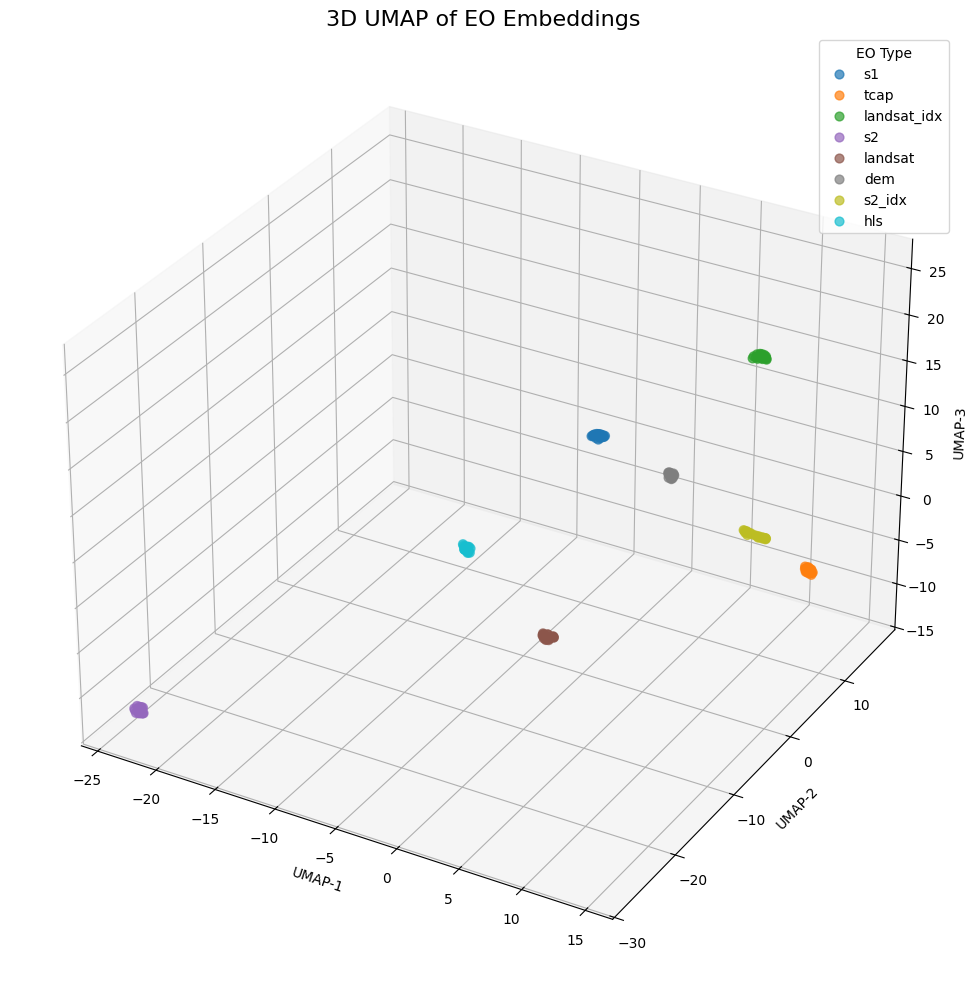

In [55]:
# import numpy as np
# import matplotlib.pyplot as plt
# import umap
# from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

# def visualize_umap_all_embeddings(embedding_dict, sample_limit=1000, n_components=3, n_neighbors=25, min_dist=0.1):
#     all_embeddings = []
#     all_labels = []

#     for eo, data in embedding_dict.items():
#         emb = data['embeddings']
#         n = len(emb)

#         if n == 0:
#             continue

#         limit = min(sample_limit, n)
#         emb = emb[:limit]
#         label = [eo] * limit

#         all_embeddings.append(emb)
#         all_labels.extend(label)

#     # Stack all embeddings
#     X = np.vstack(all_embeddings)

#     # Run UMAP
#     reducer = umap.UMAP(n_components=n_components, n_neighbors=n_neighbors, min_dist=min_dist, metric='cosine', random_state=42)
#     X_umap = reducer.fit_transform(X)

#     unique_labels = list(set(all_labels))
#     colors = plt.cm.get_cmap('tab10', len(unique_labels))

#     if n_components == 3:
#         fig = plt.figure(figsize=(14, 10))
#         ax = fig.add_subplot(111, projection='3d')
#         for i, eo in enumerate(unique_labels):
#             idx = [j for j, label in enumerate(all_labels) if label == eo]
#             ax.scatter(X_umap[idx, 0], X_umap[idx, 1], X_umap[idx, 2],
#                        label=eo, s=40, alpha=0.7, color=colors(i))
#         ax.set_xlabel("UMAP-1")
#         ax.set_ylabel("UMAP-2")
#         ax.set_zlabel("UMAP-3")
#         ax.set_title("3D UMAP of EO Embeddings", fontsize=16)
#     else:
#         plt.figure(figsize=(12, 8))
#         for i, eo in enumerate(unique_labels):
#             idx = [j for j, label in enumerate(all_labels) if label == eo]
#             plt.scatter(X_umap[idx, 0], X_umap[idx, 1],
#                         label=eo, s=40, alpha=0.7, color=colors(i))
#         plt.xlabel("UMAP-1")
#         plt.ylabel("UMAP-2")
#         plt.title("2D UMAP of EO Embeddings", fontsize=16)

#     plt.legend(title="EO Type")
#     plt.tight_layout()
#     plt.show()

# # Run UMAP visualization (3D or 2D by changing n_components)
# visualize_umap_all_embeddings(embedding_dict, n_components=3)


----------break--------------------------

# embed with spatial info

In [70]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
import rasterio
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# --- Configs ---
eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']
bands_per_cov = {
    's1': 4, 's2': 6, 's2_idx': 8,
    'landsat': 6, 'landsat_idx': 7, 'hls': 7,
    'tcap': 6, 'dem': 2
}
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# --- Dataset Class with spatial info ---
class EODataset(Dataset):
    def __init__(self, eo_name, data_dir, split, target_df, patch_size=32):
        self.eo_name = eo_name
        self.data_dir = data_dir
        self.split = split
        self.patch_size = patch_size
        self.target_df = target_df

        all_files = sorted([f for f in os.listdir(data_dir)
                            if f.startswith(f"{eo_name}_{split}_") and f.endswith(".tif")])
        target_files = set(target_df['filename'])
        self.files = [f for f in all_files if f in target_files]

        print(f"[INFO] {split.upper()} {eo_name} dataset initialized with {len(self.files)} tiles")

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        filename = self.files[idx]
        filepath = os.path.join(self.data_dir, filename)

        with rasterio.open(filepath) as src:
            array_resized = src.read(
                out_shape=(src.count, self.patch_size, self.patch_size),
                resampling=rasterio.enums.Resampling.bilinear
            )
            bounds = src.bounds
            x_center = (bounds.left + bounds.right) / 2
            y_center = (bounds.top + bounds.bottom) / 2

        img_tensor = torch.from_numpy(array_resized).float()

        row = self.target_df[self.target_df['filename'] == filename]
        target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
        target_tensor = torch.tensor(target, dtype=torch.float32)

        spatial_tensor = torch.tensor([x_center, y_center], dtype=torch.float32)

        return img_tensor, target_tensor, spatial_tensor


# --- Vision Transformer Model ---
class EOViT(nn.Module):
    def __init__(self, in_channels, patch_size=16, emb_dim=64, num_heads=4, num_layers=2, patch_dim=32):
        super().__init__()
        self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
        num_patches = (patch_dim // patch_size) ** 2
        self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
        self.pos_embed = nn.Parameter(torch.randn(1, num_patches + 1, emb_dim))
        encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

    def forward(self, x):
        B = x.size(0)
        x = self.patch_embed(x).flatten(2).transpose(1, 2)  # (B, N, emb_dim)
        cls_tokens = self.cls_token.expand(B, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.transformer(x)
        return self.mlp_head(x[:, 0]).squeeze(1)

    def extract_cls_embeddings(self, x):
        B = x.size(0)
        x = self.patch_embed(x).flatten(2).transpose(1, 2)
        cls_tokens = self.cls_token.expand(B, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.transformer(x)
        return x[:, 0]  # return CLS token


# --- Extract CLS + spatial embeddings ---
def extract_embeddings_and_spatial(model, dataloader, device):
    model.eval()
    all_embeddings, all_targets, all_coords = [], [], []

    with torch.no_grad():
        for x, y, coord in dataloader:
            x = x.to(device)
            emb = model.extract_cls_embeddings(x).cpu()
            all_embeddings.append(emb)
            all_targets.append(y)
            all_coords.append(coord)

    embeddings = torch.cat(all_embeddings, dim=0).numpy()
    targets = torch.cat(all_targets, dim=0).numpy()
    coords = torch.cat(all_coords, dim=0).numpy()
    print(f"[INFO] Extracted {len(embeddings)} CLS + spatial embeddings")
    return embeddings, targets, coords


# --- t-SNE Visualization with Spatial Color Coding ---
def visualize_tsne_with_spatial(embeddings, coords, targets=None, eo_name="", color_by='x'):
    from sklearn.preprocessing import StandardScaler
    if color_by == 'x':
        color = coords[:, 0]
        color_label = 'Tile X (center)'
    elif color_by == 'y':
        color = coords[:, 1]
        color_label = 'Tile Y (center)'
    else:
        color = targets
        color_label = 'PAI'

    emb_plus_xy = np.hstack([embeddings, coords])  # Add spatial info to embedding space
    tsne = TSNE(n_components=2, perplexity=10, random_state=42)
    reduced = tsne.fit_transform(emb_plus_xy)

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=color, cmap='viridis', s=40)
    plt.colorbar(scatter, label=color_label)
    plt.title(f't-SNE of {eo_name} Embeddings + Spatial')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.grid(True)
    plt.show()


# --- Main pipeline ---
def main_pipeline(data_root_dir, avg_target_df, patch_size=32, batch_size=8):
    embedding_dict = {}
    for eo in eo_list:
        print(f"\n[INFO] Processing EO product: {eo}")

        train_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_train_')]
        val_df = avg_target_df[avg_target_df['filename'].str.contains(f'{eo}_val_')]

        val_dataset = EODataset(eo, data_root_dir, 'val', val_df, patch_size=patch_size)
        val_loader = DataLoader(val_dataset, batch_size=batch_size)

        model = EOViT(in_channels=bands_per_cov[eo], patch_size=16, emb_dim=64, patch_dim=patch_size).to(device)

        emb, targets, coords = extract_embeddings_and_spatial(model, val_loader, device)
        embedding_dict[eo] = {'embeddings': emb, 'targets': targets, 'coords': coords}

        # visualize_tsne_with_spatial(emb, coords, targets, eo_name=eo, color_by='x')  # try color_by='y' or 'target'

    return embedding_dict


# === Usage ===
# Make sure avg_target_df contains at least: ['filename', 'avg_pai']
data_root_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data'
embedding_dict = main_pipeline(data_root_dir, avg_target_df)



[INFO] Processing EO product: s1
[INFO] VAL s1 dataset initialized with 25 tiles
[INFO] Extracted 25 CLS + spatial embeddings

[INFO] Processing EO product: s2
[INFO] VAL s2 dataset initialized with 26 tiles
[INFO] Extracted 26 CLS + spatial embeddings

[INFO] Processing EO product: landsat
[INFO] VAL landsat dataset initialized with 25 tiles
[INFO] Extracted 25 CLS + spatial embeddings

[INFO] Processing EO product: landsat_idx
[INFO] VAL landsat_idx dataset initialized with 25 tiles
[INFO] Extracted 25 CLS + spatial embeddings

[INFO] Processing EO product: hls
[INFO] VAL hls dataset initialized with 25 tiles
[INFO] Extracted 25 CLS + spatial embeddings

[INFO] Processing EO product: tcap
[INFO] VAL tcap dataset initialized with 25 tiles
[INFO] Extracted 25 CLS + spatial embeddings

[INFO] Processing EO product: dem
[INFO] VAL dem dataset initialized with 26 tiles
[INFO] Extracted 26 CLS + spatial embeddings

[INFO] Processing EO product: s2_idx
[INFO] VAL s2_idx dataset initialized

In [71]:
embedding_dict

{'s1': {'embeddings': array([[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [ 0.40387592, -0.7735452 , -1.6022727 , ..., -1.2405173 ,
           0.16380027,  0.55800396],
         [ 0.37692487, -0.80011266, -1.6569704 , ..., -1.2443486 ,
           0.24181226,  0.5674476 ],
         ...,
         [ 0.3354032 , -0.90575624, -1.6674597 , ..., -1.3213071 ,
           0.25223863,  0.43822256],
         [ 0.38354504, -0.7658444 , -1.586292  , ..., -1.2465688 ,
           0.1655055 ,  0.50575906],
         [ 0.40168586, -0.75261176, -1.5431936 , ..., -1.222276  ,
           0.10921938,  0.5322002 ]], dtype=float32),
  'targets': array([5.0808783 , 4.5393934 , 3.096212  , 3.0381982 , 2.782471  ,
         4.3806767 , 0.3472858 , 2.6318781 , 2.002462  , 0.5071922 ,
         2.0887268 , 3.5903184 , 1.2144097 , 2.407145  , 4.4200277 ,
         2.2239034 , 4.7247057 , 0.43416214, 0.12371969, 1.9222094 ,
         0.29163796, 3.419378  , 0.093

In [72]:
import numpy as np

def clean_embedding_dict(embedding_dict):
    cleaned_dict = {}

    for key, data in embedding_dict.items():
        embeddings = data['embeddings']
        targets = data['targets']
        coords = data['coords']

        # Create mask for rows without any NaNs in the embeddings
        valid_mask = ~np.isnan(embeddings).any(axis=1)
#
        num_dropped = len(valid_mask) - np.count_nonzero(valid_mask)
        print(f"[INFO] Dropping {num_dropped} NaN rows from '{key}'")

        # Filter arrays using the valid mask
        cleaned_dict[key] = {
            'embeddings': embeddings[valid_mask],
            'targets': targets[valid_mask],
            'coords': coords[valid_mask]
        }

    return cleaned_dict
embedding_dict = clean_embedding_dict(embedding_dict)


[INFO] Dropping 3 NaN rows from 's1'
[INFO] Dropping 2 NaN rows from 's2'
[INFO] Dropping 2 NaN rows from 'landsat'
[INFO] Dropping 2 NaN rows from 'landsat_idx'
[INFO] Dropping 3 NaN rows from 'hls'
[INFO] Dropping 2 NaN rows from 'tcap'
[INFO] Dropping 2 NaN rows from 'dem'
[INFO] Dropping 2 NaN rows from 's2_idx'


In [73]:
embedding_dict

{'s1': {'embeddings': array([[ 0.40387592, -0.7735452 , -1.6022727 , ..., -1.2405173 ,
           0.16380027,  0.55800396],
         [ 0.37692487, -0.80011266, -1.6569704 , ..., -1.2443486 ,
           0.24181226,  0.5674476 ],
         [ 0.38707414, -0.79368025, -1.575694  , ..., -1.2365749 ,
           0.1458799 ,  0.5657738 ],
         ...,
         [ 0.3354032 , -0.90575624, -1.6674597 , ..., -1.3213071 ,
           0.25223863,  0.43822256],
         [ 0.38354504, -0.7658444 , -1.586292  , ..., -1.2465688 ,
           0.1655055 ,  0.50575906],
         [ 0.40168586, -0.75261176, -1.5431936 , ..., -1.222276  ,
           0.10921938,  0.5322002 ]], dtype=float32),
  'targets': array([4.5393934 , 3.096212  , 3.0381982 , 2.782471  , 4.3806767 ,
         0.3472858 , 2.6318781 , 2.002462  , 0.5071922 , 2.0887268 ,
         3.5903184 , 2.407145  , 2.2239034 , 4.7247057 , 0.43416214,
         0.12371969, 1.9222094 , 0.29163796, 3.419378  , 0.09393962,
         3.9520385 , 1.1669382 ], dtyp

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/tmp/ipython-input-74-1796461061.py:60: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


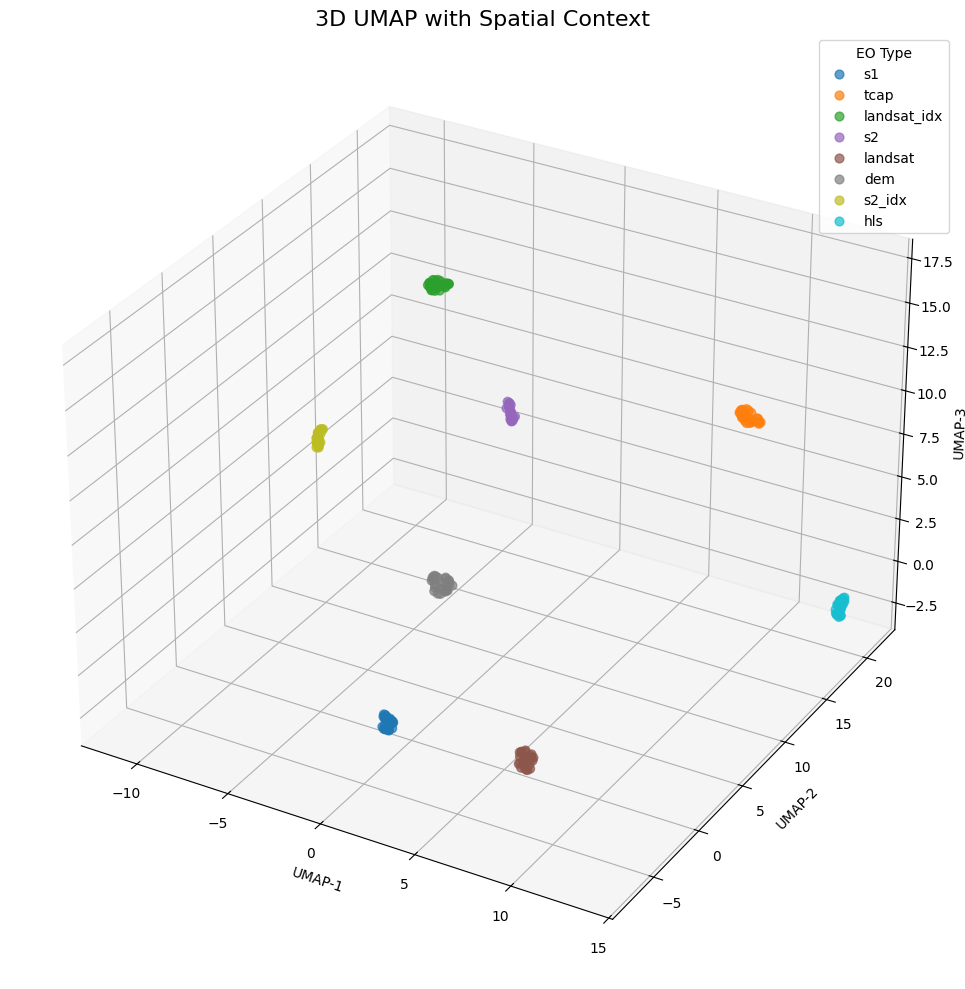

In [74]:
import numpy as np
import matplotlib.pyplot as plt
import umap
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

def visualize_umap_all_embeddings_with_spatial(
    embedding_dict,
    sample_limit=1000,
    n_components=3,
    n_neighbors=25,
    min_dist=0.1,
    alpha=100.0  # spatial weight
):
    all_embeddings = []
    all_coords = []
    all_labels = []

    for eo, data in embedding_dict.items():
        emb = data['embeddings']
        coords = data.get('coords')

        n = len(emb)
        if n == 0 or coords is None:
            continue

        limit = min(sample_limit, n)
        emb = emb[:limit]
        coords = coords[:limit]
        label = [eo] * limit

        all_embeddings.append(emb)
        all_coords.append(coords)
        all_labels.extend(label)

    # Stack data
    X_emb = np.vstack(all_embeddings)
    X_coords = np.vstack(all_coords)

    # Normalize spatial coordinates to [0, 1]
    X_coords = (X_coords - X_coords.min(axis=0)) / (X_coords.max(axis=0) - X_coords.min(axis=0))

    # Scale spatial features
    X_spatial = X_coords * alpha

    # Combine embeddings and spatial info
    X_combined = np.hstack([X_emb, X_spatial])

    # UMAP projection
    reducer = umap.UMAP(
        n_components=n_components,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric='cosine',
        random_state=42
    )
    X_umap = reducer.fit_transform(X_combined)

    # Plot
    unique_labels = list(set(all_labels))
    colors = plt.cm.get_cmap('tab10', len(unique_labels))

    if n_components == 3:
        fig = plt.figure(figsize=(14, 10))
        ax = fig.add_subplot(111, projection='3d')
        for i, eo in enumerate(unique_labels):
            idx = [j for j, label in enumerate(all_labels) if label == eo]
            ax.scatter(X_umap[idx, 0], X_umap[idx, 1], X_umap[idx, 2],
                       label=eo, s=40, alpha=0.7, color=colors(i))
        ax.set_xlabel("UMAP-1")
        ax.set_ylabel("UMAP-2")
        ax.set_zlabel("UMAP-3")
        ax.set_title("3D UMAP with Spatial Context", fontsize=16)
    else:
        plt.figure(figsize=(12, 8))
        for i, eo in enumerate(unique_labels):
            idx = [j for j, label in enumerate(all_labels) if label == eo]
            plt.scatter(X_umap[idx, 0], X_umap[idx, 1],
                        label=eo, s=40, alpha=0.7, color=colors(i))
        plt.xlabel("UMAP-1")
        plt.ylabel("UMAP-2")
        plt.title("2D UMAP with Spatial Context", fontsize=16)

    plt.legend(title="EO Type")
    plt.tight_layout()
    plt.show()

# Example use (with spatial influence)
visualize_umap_all_embeddings_with_spatial(
    embedding_dict,
    n_components=3,
    alpha=5.0  # try 1.0, 5.0, 10.0 to see the effect
)


# Fusion model

[Epoch 1] Train Loss: 0.0376 | Val Loss: 1.0929
[Epoch 2] Train Loss: 0.0175 | Val Loss: 0.9797
[Epoch 3] Train Loss: 0.0059 | Val Loss: 0.8777
[Epoch 4] Train Loss: 0.0005 | Val Loss: 0.7930
[Epoch 5] Train Loss: 0.0005 | Val Loss: 0.7339
[Epoch 6] Train Loss: 0.0033 | Val Loss: 0.7070
[Epoch 7] Train Loss: 0.0054 | Val Loss: 0.7085
[Epoch 8] Train Loss: 0.0052 | Val Loss: 0.7287
[Epoch 9] Train Loss: 0.0036 | Val Loss: 0.7608
[Epoch 10] Train Loss: 0.0017 | Val Loss: 0.7991
[Epoch 11] Train Loss: 0.0004 | Val Loss: 0.8370
[Epoch 12] Train Loss: 0.0000 | Val Loss: 0.8693
[Epoch 13] Train Loss: 0.0004 | Val Loss: 0.8933
[Epoch 14] Train Loss: 0.0011 | Val Loss: 0.9034
[Epoch 15] Train Loss: 0.0015 | Val Loss: 0.9049
[Epoch 16] Train Loss: 0.0015 | Val Loss: 0.8977
[Epoch 17] Train Loss: 0.0012 | Val Loss: 0.8840
[Epoch 18] Train Loss: 0.0008 | Val Loss: 0.8661
[Epoch 19] Train Loss: 0.0003 | Val Loss: 0.8466
[Epoch 20] Train Loss: 0.0001 | Val Loss: 0.8276


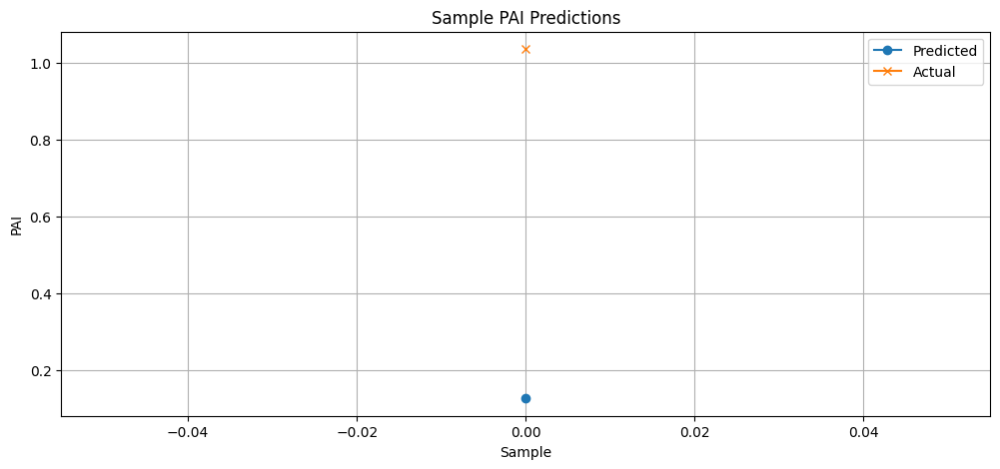

Validation sample count: 1


In [78]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import random

# --- Attention-Based Fusion Module ---
class AttentionFusion(nn.Module):
    def __init__(self, num_eos=8, emb_dim=64):
        super().__init__()
        self.query = nn.Linear(emb_dim, emb_dim)
        self.key = nn.Linear(emb_dim, emb_dim)
        self.value = nn.Linear(emb_dim, emb_dim)
        self.scale = emb_dim ** 0.5

    def forward(self, x):  # x: [B, N, D]
        Q = self.query(x)
        K = self.key(x)
        V = self.value(x)
        attn_scores = torch.matmul(Q, K.transpose(-2, -1)) / self.scale  # [B, N, N]
        attn_weights = F.softmax(attn_scores, dim=-1)
        fused = torch.matmul(attn_weights, V)  # [B, N, D]
        return fused.mean(dim=1)  # [B, D]

# --- Regression Model with Fusion ---
class PAIRegressorWithFusion(nn.Module):
    def __init__(self, num_eos=8, emb_dim=64, hidden_dim=128):
        super().__init__()
        self.fusion = AttentionFusion(num_eos, emb_dim)
        self.regressor = nn.Sequential(
            nn.Linear(emb_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, x):  # x: [B, N, D]
        fused = self.fusion(x)  # [B, D]
        return self.regressor(fused).squeeze(1)

# --- Prepare Fusion Dataset from embedding_dict ---
# def prepare_fusion_dataset(embedding_dict, eo_list):
#     tensors = []
#     for eo in eo_list:
#         emb = torch.tensor(embedding_dict[eo]['embeddings'], dtype=torch.float32)  # [B, D]
#         tensors.append(emb.unsqueeze(1))  # [B, 1, D]
#     x = torch.cat(tensors, dim=1)  # [B, N, D]

#     # Assume targets are the same for all EO sources
#     y = torch.tensor(embedding_dict[eo_list[0]]['targets'], dtype=torch.float32)  # [B]
#     return TensorDataset(x, y)

def align_and_prepare_dataset(embedding_dict, eo_list, emb_dim=64, min_sources=6):
    from collections import defaultdict

    # Step 1: Collect tile -> list of (eo, idx) mappings
    coord_to_eo_idx = defaultdict(list)
    for eo in eo_list:
        coords = embedding_dict[eo]['coords']
        for idx, coord in enumerate(coords):
            coord_tuple = tuple(coord)
            coord_to_eo_idx[coord_tuple].append((eo, idx))

    # Step 2: Filter tiles with at least min_sources available
    filtered_tiles = {coord: entries for coord, entries in coord_to_eo_idx.items() if len(entries) >= min_sources}
    if not filtered_tiles:
        raise ValueError(f"No tiles found with at least {min_sources} sources.")

    # Step 3: Construct aligned dataset
    x_list = []
    y_list = []

    for coord, eo_indices in filtered_tiles.items():
        eo_to_idx = dict(eo_indices)

        emb_stack = []
        for eo in eo_list:
            if eo in eo_to_idx:
                idx = eo_to_idx[eo]
                emb = embedding_dict[eo]['embeddings'][idx]
                # Pad or trim to emb_dim
                if emb.shape[0] < emb_dim:
                    emb = np.pad(emb, (0, emb_dim - emb.shape[0]), mode='constant')
                elif emb.shape[0] > emb_dim:
                    emb = emb[:emb_dim]
            else:
                # Missing EO source — use zero vector
                emb = np.zeros(emb_dim, dtype=np.float32)
            emb_stack.append(torch.tensor(emb, dtype=torch.float32).unsqueeze(0))

        x = torch.cat(emb_stack, dim=0)  # [N, D]
        x_list.append(x.unsqueeze(0))    # [1, N, D]

        # Use target from a reliable EO source (e.g. first in list that exists for this coord)
        for eo in eo_list:
            if eo in eo_to_idx:
                idx = eo_to_idx[eo]
                target = embedding_dict[eo]['targets'][idx]
                y_list.append(torch.tensor(target, dtype=torch.float32))
                break

    x_tensor = torch.cat(x_list, dim=0)  # [B, N, D]
    y_tensor = torch.stack(y_list)       # [B]

    return TensorDataset(x_tensor, y_tensor)



# --- Training Utilities ---
def train_one_epoch(model, dataloader, optimizer, loss_fn, device):
    model.train()
    total_loss = 0
    for x, y in dataloader:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        pred = model(x)
        loss = loss_fn(pred, y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * x.size(0)
    return total_loss / len(dataloader.dataset)

def evaluate(model, dataloader, loss_fn, device):
    model.eval()
    preds, targets = [], []
    with torch.no_grad():
        for x, y in dataloader:
            x, y = x.to(device), y.to(device)
            pred = model(x)
            preds.append(pred.cpu())
            targets.append(y.cpu())
    preds = torch.cat(preds)
    targets = torch.cat(targets)
    loss = loss_fn(preds, targets)
    return loss.item(), preds, targets

# --- Visualization (Optional) ---
# def plot_sample_predictions(preds, targets, n=20):
#     import matplotlib.pyplot as plt
#     indices = random.sample(range(len(preds)), n)
#     plt.figure(figsize=(12, 5))
#     plt.plot(preds[indices], label="Predicted", marker='o')
#     plt.plot(targets[indices], label="Actual", marker='x')
#     plt.title("Sample PAI Predictions")
#     plt.xlabel("Sample")
#     plt.ylabel("PAI")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

def plot_sample_predictions(preds, targets, n=20):
    import matplotlib.pyplot as plt
    n = min(n, len(preds))  # <-- Prevent sampling too many
    indices = random.sample(range(len(preds)), n)
    plt.figure(figsize=(12, 5))
    plt.plot(range(n), preds[indices], label="Predicted", marker='o')
    plt.plot(range(n), targets[indices], label="Actual", marker='x')
    plt.title("Sample PAI Predictions")
    plt.xlabel("Sample")
    plt.ylabel("PAI")
    plt.legend()
    plt.grid(True)
    plt.show()

# --- Main Pipeline ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
eo_list = ['s1', 's2', 'landsat', 'landsat_idx', 'hls', 'tcap', 'dem', 's2_idx']

# Prepare data
full_dataset = align_and_prepare_dataset(embedding_dict, eo_list)
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_ds, val_ds = torch.utils.data.random_split(full_dataset, [train_size, val_size])

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=32)

# Initialize model
model = PAIRegressorWithFusion(num_eos=len(eo_list), emb_dim=64).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

# Train
epochs = 20
for epoch in range(1, epochs + 1):
    train_loss = train_one_epoch(model, train_loader, optimizer, loss_fn, device)
    val_loss, preds, targets = evaluate(model, val_loader, loss_fn, device)
    print(f"[Epoch {epoch}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

# Visualize results
plot_sample_predictions(preds.numpy(), targets.numpy())
print(f"Validation sample count: {len(targets)}")

# Run Spatial predcition in GEE

In [83]:
!pwd

/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results


In [82]:
%cd '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results'

/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results


In [84]:
# Save your model
torch.save(model.state_dict(), 'fusion_model.pt')


In [85]:
!gcloud auth login
!gsutil cp fusion_model_scripted.pt gs://your-bucket-name/models/fusion_model_scripted.pt


You are running on a Google Compute Engine virtual machine.
It is recommended that you use service accounts for authentication.

You can run:

  $ gcloud config set account `ACCOUNT`

to switch accounts if necessary.

Your credentials may be visible to others with access to this
virtual machine. Are you sure you want to authenticate with
your personal account?

Do you want to continue (Y/n)?  

Command killed by keyboard interrupt

^C
Traceback (most recent call last):
  File "/tools/google-cloud-sdk/bin/bootstrapping/gsutil.py", line 15, in <module>
    import bootstrapping
  File "/tools/google-cloud-sdk/bin/bootstrapping/bootstrapping.py", line 50, in <module>
    from googlecloudsdk.core.credentials import store as c_store
  File "/tools/google-cloud-sdk/lib/googlecloudsdk/core/credentials/store.py", line 34, in <module>
    from googlecloudsdk.api_lib.auth import external_account as auth_external_account
  File "/tools/google-cloud-sdk/lib/googlecloudsdk/api_lib/auth/external_acc

GEE predict back to the coraivate stack

In [79]:
# Authenticate and initialize Earth Engine
import ee
import geemap
import geemap.chart as chart
ee.Authenticate()
ee.Initialize(project='servir-sco-assets')
Map = geemap.Map()

In [80]:

s1Ascending_2021 = ee.Image("projects/servir-sco-assets/assets/Rx_Fire/EO_Outputs/Sewanee/s1Ascending_2021")
DEMindices_2021 = ee.Image("projects/servir-sco-assets/assets/Rx_Fire/EO_Outputs/Sewanee/DEMindices_2021_7_17")
HLS_2021 = ee.Image("projects/servir-sco-assets/assets/Rx_Fire/EO_Outputs/Sewanee/HLS_2021")
LandsatComposite_2021 = ee.Image("projects/servir-sco-assets/assets/Rx_Fire/EO_Outputs/Sewanee/LandsatComposite_2021")
LandsatIndices_2021 = ee.Image("projects/servir-sco-assets/assets/Rx_Fire/EO_Outputs/Sewanee/LandsatIndices_2021")
S2Composite_2021 = ee.Image("projects/servir-sco-assets/assets/Rx_Fire/EO_Outputs/Sewanee/S2Composite_2021")
S2Indices_2021 = ee.Image("projects/servir-sco-assets/assets/Rx_Fire/EO_Outputs/Sewanee/S2Indices_2021")
landsatTasseledCapIndices_2021 = ee.Image("projects/servir-sco-assets/assets/Rx_Fire/EO_Outputs/Sewanee/landsatTasseledCapIndices_2021")
ROI = ee.FeatureCollection('projects/servir-sco-assets/assets/Rx_Fire/Vector_Data/Sewanee_Domain')
# GEDIindicesA_2021 = ee.Image("projects/servir-sco-assets/assets/Rx_Fire/EO_Outputs/Sewanee/GEDIindicesA_2021")
# GEDIindicesB_2021 = ee.Image("projects/servir-sco-assets/assets/Rx_Fire/EO_Outputs/Sewanee/GEDIindicesB_2021")

Map.addLayer(ROI, {}, 'ROI')
Map.addLayer(s1Ascending_2021, {}, 's1Ascending_2021')
Map.addLayer(DEMindices_2021, {}, 'DEMindices_2021')
# Map.addLayer(GEDIindicesA_2021, {}, 'GEDIindicesA_2021')
# Map.addLayer(GEDIindicesB_2021, {}, 'GEDIindicesB_2021')
Map.addLayer(HLS_2021, {}, 'HLS_2021')
Map.addLayer(LandsatComposite_2021, {}, 'LandsatComposite_2021')
Map.addLayer(LandsatIndices_2021, {}, 'LandsatIndices_2021')
Map.addLayer(S2Composite_2021, {}, 'S2Composite_2021')
Map.addLayer(S2Indices_2021, {}, 'S2Indices_2021')
Map.addLayer(landsatTasseledCapIndices_2021, {}, 'landsatTasseledCapIndices_2021')

stacked = s1Ascending_2021.addBands(DEMindices_2021).addBands(LandsatComposite_2021).addBands(LandsatIndices_2021).addBands(landsatTasseledCapIndices_2021).addBands(HLS_2021).addBands(S2Composite_2021).addBands(S2Indices_2021)

Map.addLayer(stacked, {}, 'stacked');

Map


Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

# S1 branch

In [ ]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE
# from sklearn.decomposition import PCA

# # --- Dataset ---
# class S1Dataset(Dataset):
#     def __init__(self, data_dir, split, target_df, patch_size=32):
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"s1_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split} dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_fix_patch(self, filepath):
#         with rasterio.open(filepath) as src:
#             array = src.read(out_dtype='float32')
#         tensor = torch.from_numpy(array)

#         _, h, w = tensor.shape
#         desired = self.patch_size

#         if h > desired:
#             tensor = tensor[:, :desired, :]
#         if w > desired:
#             tensor = tensor[:, :, :desired]

#         pad_h = max(0, desired - tensor.shape[1])
#         pad_w = max(0, desired - tensor.shape[2])
#         if pad_h > 0 or pad_w > 0:
#             tensor = nn.functional.pad(tensor, (0, pad_w, 0, pad_h), mode='constant', value=0)

#         return tensor

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_fix_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor


# # --- Simple Vision Transformer ---
# class SimpleViT(nn.Module):
#     def __init__(self, in_channels=4, patch_size=16, emb_dim=64, num_heads=4, num_layers=2):
#         super().__init__()
#         self.patch_size = patch_size
#         self.emb_dim = emb_dim

#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, (32 // patch_size)**2 + 1, emb_dim))

#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

#         self.mlp_head = nn.Sequential(
#             nn.LayerNorm(emb_dim),
#             nn.Linear(emb_dim, 1)
#         )

#     def forward(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x)  # [B, emb_dim, H_patch, W_patch]
#         x = x.flatten(2).transpose(1, 2)  # [B, seq_len, emb_dim]

#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)

#         x = x + self.pos_embed
#         x = self.transformer(x)

#         cls_out = x[:, 0]
#         out = self.mlp_head(cls_out).squeeze(1)
#         return out

#     def extract_cls_embeddings(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x)
#         x = x.flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         cls_out = x[:, 0]
#         return cls_out


# # --- Extract embeddings ---
# def extract_embeddings_and_targets(model, dataloader, device):
#     model.eval()
#     all_embeddings = []
#     all_targets = []
#     with torch.no_grad():
#         for x, y in dataloader:
#             x = x.to(device)
#             embeddings = model.extract_cls_embeddings(x)
#             embeddings = embeddings.detach().cpu()
#             all_embeddings.append(embeddings)
#             all_targets.append(y)

#     embeddings = torch.cat(all_embeddings, dim=0).numpy()
#     targets = torch.cat(all_targets, dim=0).numpy()

#     # Filter NaNs
#     mask = ~np.isnan(embeddings).any(axis=1)
#     embeddings = embeddings[mask]
#     targets = targets[mask]

#     print(f"[INFO] Extracted {embeddings.shape[0]} clean embeddings (NaNs filtered)")
#     return embeddings, targets


# def visualize_tsne(embeddings, targets, use_pca=True, perplexity=30):
#     assert not np.isnan(embeddings).any(), "NaNs still present in embeddings."

#     n_samples, n_features = embeddings.shape

#     # if use_pca:
#     #     try:
#     #         n_components = min(50, n_samples, n_features)
#     #         print(f"[INFO] Applying PCA: {n_features} → {n_components} components")
#     #         pca = PCA(n_components=n_components, random_state=42)
#     #         embeddings = pca.fit_transform(embeddings)
#     #     except ValueError as e:
#     #         print("[ERROR] PCA failed due to shape mismatch.")
#     #         raise e

#     # Automatically adjust perplexity to be valid
#     safe_perplexity = min(perplexity, max(5, n_samples // 3))
#     if perplexity != safe_perplexity:
#         print(f"[INFO] Adjusting t-SNE perplexity from {perplexity} to {safe_perplexity} (must be < n_samples={n_samples})")

#     tsne = TSNE(n_components=10, perplexity=safe_perplexity, random_state=42, method = 'exact')
#     reduced = tsne.fit_transform(embeddings)

#     plt.figure(figsize=(10, 8))
#     scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=targets, cmap='viridis', s=40)
#     cbar = plt.colorbar(scatter)
#     cbar.set_label('avg_pai', rotation=270, labelpad=15)
#     plt.title('t-SNE of CLS Embeddings (ViT)')
#     plt.xlabel('t-SNE Component 1')
#     plt.ylabel('t-SNE Component 2')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()



# # --- Setup ---
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# # data_dir = "/path/to/eo_folder"  # Replace with your path
# # avg_target_df = ...              # Load your dataframe

# # Split your target dataframe into train/val/test
# train_df = avg_target_df[avg_target_df['filename'].str.contains('_train_')]
# val_df = avg_target_df[avg_target_df['filename'].str.contains('_val_')]
# test_df = avg_target_df[avg_target_df['filename'].str.contains('_test_')]

# train_dataset = S1Dataset(data_dir, 'train', train_df)
# val_dataset = S1Dataset(data_dir, 'val', val_df)
# test_dataset = S1Dataset(data_dir, 'test', test_df)

# batch_size = 8
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=batch_size)
# test_loader = DataLoader(test_dataset, batch_size=batch_size)

# # Model
# model = SimpleViT(in_channels=4).to(device)

# # Example forward check
# imgs, targets = next(iter(train_loader))
# print(f"Images batch shape: {imgs.shape}")
# print(f"Targets batch shape: {targets.shape}")

# # --- Visualize embeddings from validation set ---
# embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
# visualize_tsne(embeddings, targets)


In [ ]:
# import matplotlib.pyplot as plt

# # Grab one batch from your train_loader
# images, targets = next(iter(train_loader))

# # Visualize first sample, first channel
# sample_img = images[0, 0].cpu().numpy()

# plt.imshow(sample_img, cmap='gray')
# plt.title('Sample image - channel 0 (grayscale)')
# plt.colorbar()
# plt.show()


In [ ]:
# fig, axs = plt.subplots(1, 4, figsize=(12, 3))
# for i in range(4):
#     axs[i].imshow(images[0, i].cpu().numpy(), cmap='gray')
#     axs[i].set_title(f'Channel {i}')
#     axs[i].axis('off')
# plt.show()


In [ ]:
# import matplotlib.pyplot as plt

# # Get one batch from the DataLoader
# images, targets = next(iter(train_loader))

# # Number of samples to display (e.g., 4)
# num_samples = 4

# plt.figure(figsize=(12, 3 * num_samples))

# for i in range(num_samples):
#     img = images[i].cpu().numpy()  # shape: [C, H, W]
#     pai = targets[i].item()

#     # If you want to visualize one channel (e.g., first channel of S1)
#     img_channel = img[0]  # channel 0, shape [H, W]

#     plt.subplot(num_samples, 2, 2*i + 1)
#     plt.imshow(img_channel, cmap='gray')
#     plt.title(f"Sample {i} - Channel 0")
#     plt.axis('off')

#     plt.subplot(num_samples, 2, 2*i + 2)
#     plt.text(0.5, 0.5, f"PAI Target: {pai:.3f}", fontsize=14, ha='center', va='center')
#     plt.axis('off')

# plt.tight_layout()
# plt.show()


In [ ]:
# images, targets = next(iter(train_loader))
# print(targets)  # should show a tensor of floats, the PAI values


s1 patch embedding - T-distributed Stochastic Neighbor Embedding. (TSNE)

In [ ]:
# from sklearn.manifold import TSNE
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
# import numpy as np

# def visualize_tsne_3d(embeddings, targets, perplexity=30):
#     assert not np.isnan(embeddings).any(), "NaNs still present in embeddings."

#     n_samples = embeddings.shape[0]

#     # Safe perplexity adjustment
#     safe_perplexity = min(perplexity, max(5, n_samples // 3))
#     if perplexity != safe_perplexity:
#         print(f"[INFO] Adjusting t-SNE perplexity from {perplexity} to {safe_perplexity} (must be < n_samples={n_samples})")

#     # t-SNE in 3D
#     tsne = TSNE(n_components=3, perplexity=safe_perplexity, random_state=42)
#     reduced = tsne.fit_transform(embeddings)

#     # 3D plot
#     fig = plt.figure(figsize=(10, 8))
#     ax = fig.add_subplot(111, projection='3d')
#     sc = ax.scatter(reduced[:, 0], reduced[:, 1], reduced[:, 2], c=targets, cmap='viridis', s=60)
#     ax.set_xlabel("t-SNE Component 1")
#     ax.set_ylabel("t-SNE Component 2")
#     ax.set_zlabel("t-SNE Component 3")
#     plt.title("3D t-SNE of CLS Embeddings (ViT)")
#     cbar = plt.colorbar(sc, ax=ax, pad=0.1)
#     cbar.set_label('avg_pai', rotation=270, labelpad=15)
#     plt.tight_layout()
#     plt.show()


In [ ]:
# embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
# visualize_tsne_3d(embeddings, targets)


# DEM branch

In [ ]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE
# from sklearn.decomposition import PCA

# # --- DEM Dataset ---
# class DEMDataset(Dataset):
#     def __init__(self, data_dir, split, target_df, patch_size=32):
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"dem_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split} DEM dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_resize_patch(self, filepath):
#         with rasterio.open(filepath) as src:
#             array = src.read(out_dtype='float32')  # [C, H, W]
#             # Resample to patch_size x patch_size using bilinear interpolation
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )

#         tensor = torch.from_numpy(array_resized)
#         return tensor  # shape [C, patch_size, patch_size]

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_resize_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor



# # --- ViT for DEM (2-band input) ---
# class DEMViT(nn.Module):
#     def __init__(self, in_channels=2, patch_size=16, emb_dim=64, num_heads=4, num_layers=2):
#         super().__init__()
#         self.patch_size = patch_size
#         self.emb_dim = emb_dim

#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, (32 // patch_size)**2 + 1, emb_dim))

#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

#         self.mlp_head = nn.Sequential(
#             nn.LayerNorm(emb_dim),
#             nn.Linear(emb_dim, 1)
#         )

#     def forward(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x)  # [B, emb_dim, H_patch, W_patch]
#         x = x.flatten(2).transpose(1, 2)  # [B, seq_len, emb_dim]

#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)

#         x = x + self.pos_embed
#         x = self.transformer(x)

#         cls_out = x[:, 0]
#         out = self.mlp_head(cls_out).squeeze(1)
#         return out

#     def extract_cls_embeddings(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x)
#         x = x.flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]

# # --- Embedding extraction ---
# def extract_embeddings_and_targets(model, dataloader, device):
#     model.eval()
#     all_embeddings = []
#     all_targets = []
#     with torch.no_grad():
#         for x, y in dataloader:
#             x = x.to(device)
#             embeddings = model.extract_cls_embeddings(x)
#             embeddings = embeddings.detach().cpu()
#             all_embeddings.append(embeddings)
#             all_targets.append(y)

#     embeddings = torch.cat(all_embeddings, dim=0).numpy()
#     targets = torch.cat(all_targets, dim=0).numpy()

#     mask = ~np.isnan(embeddings).any(axis=1)
#     embeddings = embeddings[mask]
#     targets = targets[mask]

#     print(f"[INFO] Extracted {embeddings.shape[0]} clean embeddings (NaNs filtered)")
#     return embeddings, targets

# # --- t-SNE visualization ---
# def visualize_tsne(embeddings, targets, use_pca=True, perplexity=30):
#     assert not np.isnan(embeddings).any(), "NaNs still present in embeddings."

#     n_samples, n_features = embeddings.shape
#     safe_perplexity = min(perplexity, max(5, n_samples // 3))
#     if perplexity != safe_perplexity:
#         print(f"[INFO] Adjusting t-SNE perplexity from {perplexity} to {safe_perplexity}")

#     tsne = TSNE(n_components=2, perplexity=safe_perplexity, random_state=42, method='exact')
#     reduced = tsne.fit_transform(embeddings)

#     plt.figure(figsize=(10, 8))
#     scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=targets, cmap='viridis', s=40)
#     cbar = plt.colorbar(scatter)
#     cbar.set_label('avg_pai', rotation=270, labelpad=15)
#     plt.title('t-SNE of DEM CLS Embeddings (ViT)')
#     plt.xlabel('t-SNE Component 1')
#     plt.ylabel('t-SNE Component 2')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()

# # --- Setup ---
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# # Split DataFrame
# train_df = avg_target_df[avg_target_df['filename'].str.contains('_train_')]
# val_df = avg_target_df[avg_target_df['filename'].str.contains('_val_')]
# test_df = avg_target_df[avg_target_df['filename'].str.contains('_test_')]

# # Datasets and Loaders
# train_dataset = DEMDataset(data_dir, 'train', train_df)
# val_dataset = DEMDataset(data_dir, 'val', val_df)
# test_dataset = DEMDataset(data_dir, 'test', test_df)

# batch_size = 8
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=batch_size)
# test_loader = DataLoader(test_dataset, batch_size=batch_size)

# # Model
# model = DEMViT(in_channels=2).to(device)

# # Check shape
# imgs, targets = next(iter(train_loader))
# print(f"Images batch shape: {imgs.shape}")
# print(f"Targets batch shape: {targets.shape}")

# # Visualize embeddings
# embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
# visualize_tsne(embeddings, targets)

In [ ]:
# import matplotlib.pyplot as plt
# import random
# import torch

# # Set how many samples to visualize
# num_samples = 4

# # Random indices from the dataset
# indices = random.sample(range(len(train_dataset)), num_samples)

# plt.figure(figsize=(8, num_samples * 3))

# for i, idx in enumerate(indices):
#     image, pai = train_dataset[idx]  # Get image tensor and target
#     image = image.cpu().numpy()      # shape: [2, 32, 32]

#     for ch in range(image.shape[0]):
#         plt.subplot(num_samples, image.shape[0], i * image.shape[0] + ch + 1)
#         plt.imshow(image[ch], cmap='gray')
#         title = f"Sample {idx} - Ch{ch+1}" if ch == 0 else f"Ch{ch+1}"
#         plt.title(title)
#         plt.axis('off')

#     # Optionally print the PAI
#     print(f"[INFO] Sample {idx} - PAI: {pai:.3f}")

# plt.tight_layout()
# plt.show()


# HLS Branch

In [ ]:
# # --- HLS Dataset ---
# class HLSDataset(Dataset):
#     def __init__(self, data_dir, split, target_df, patch_size=32):
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"hls_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split} HLS dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_resize_patch(self, filepath):
#         with rasterio.open(filepath) as src:
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )
#         tensor = torch.from_numpy(array_resized.astype(np.float32))
#         return tensor  # shape [C=7, patch_size, patch_size]

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_resize_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor


# # --- ViT for HLS (7-band input) ---
# class HLSViT(nn.Module):
#     def __init__(self, in_channels=7, patch_size=16, emb_dim=64, num_heads=4, num_layers=2):
#         super().__init__()
#         self.patch_size = patch_size
#         self.emb_dim = emb_dim

#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, (32 // patch_size)**2 + 1, emb_dim))

#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

#         self.mlp_head = nn.Sequential(
#             nn.LayerNorm(emb_dim),
#             nn.Linear(emb_dim, 1)
#         )

#     def forward(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x)  # [B, emb_dim, H_patch, W_patch]
#         x = x.flatten(2).transpose(1, 2)  # [B, seq_len, emb_dim]

#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)

#         x = x + self.pos_embed
#         x = self.transformer(x)

#         cls_out = x[:, 0]
#         out = self.mlp_head(cls_out).squeeze(1)
#         return out

#     def extract_cls_embeddings(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x)
#         x = x.flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]


# # --- Dataset Setup ---
# train_df = avg_target_df[avg_target_df['filename'].str.contains('_train_')]
# val_df = avg_target_df[avg_target_df['filename'].str.contains('_val_')]
# test_df = avg_target_df[avg_target_df['filename'].str.contains('_test_')]

# train_dataset = HLSDataset(data_dir, 'train', train_df)
# val_dataset = HLSDataset(data_dir, 'val', val_df)
# test_dataset = HLSDataset(data_dir, 'test', test_df)

# batch_size = 8
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=batch_size)
# test_loader = DataLoader(test_dataset, batch_size=batch_size)

# # --- Model ---
# model = HLSViT(in_channels=7).to(device)

# # --- Debug Shape ---
# imgs, targets = next(iter(train_loader))
# print(f"Images batch shape: {imgs.shape}")   # [B, 7, 32, 32]
# print(f"Targets batch shape: {targets.shape}")

# # --- Embedding + Visualization ---
# embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
# visualize_tsne(embeddings, targets)


In [ ]:
# import matplotlib.pyplot as plt
# import random
# import torch

# # Set how many samples to visualize
# num_samples = 4

# # Random indices from the dataset
# indices = random.sample(range(len(train_dataset)), num_samples)

# plt.figure(figsize=(8, num_samples * 3))

# for i, idx in enumerate(indices):
#     image, pai = train_dataset[idx]  # Get image tensor and target
#     image = image.cpu().numpy()      # shape: [2, 32, 32]

#     for ch in range(image.shape[0]):
#         plt.subplot(num_samples, image.shape[0], i * image.shape[0] + ch + 1)
#         plt.imshow(image[ch], cmap='gray')
#         title = f"Sample {idx} - Ch{ch+1}" if ch == 0 else f"Ch{ch+1}"
#         plt.title(title)
#         plt.axis('off')

#     # Optionally print the PAI
#     print(f"[INFO] Sample {idx} - PAI: {pai:.3f}")

# plt.tight_layout()
# plt.show()


# LS Branch

In [ ]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE

# # --- Landsat Dataset ---
# class LandsatDataset(Dataset):
#     def __init__(self, data_dir, split, target_df, patch_size=32):
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"landsat_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split} Landsat dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_resize_patch(self, filepath):
#         with rasterio.open(filepath) as src:
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )
#         return torch.from_numpy(array_resized)

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_resize_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor


# # --- ViT for Landsat (6-band input) ---
# class LandsatViT(nn.Module):
#     def __init__(self, in_channels=6, patch_size=16, emb_dim=64, num_heads=4, num_layers=2):
#         super().__init__()
#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, (32 // patch_size)**2 + 1, emb_dim))
#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
#         self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

#     def forward(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return self.mlp_head(x[:, 0]).squeeze(1)

#     def extract_cls_embeddings(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]


# # --- Embedding Extraction ---
# def extract_embeddings_and_targets(model, dataloader, device):
#     model.eval()
#     all_embeddings, all_targets = [], []
#     with torch.no_grad():
#         for x, y in dataloader:
#             x = x.to(device)
#             embeddings = model.extract_cls_embeddings(x).detach().cpu()
#             all_embeddings.append(embeddings)
#             all_targets.append(y)
#     embeddings = torch.cat(all_embeddings).numpy()
#     targets = torch.cat(all_targets).numpy()
#     mask = ~np.isnan(embeddings).any(axis=1)
#     print(f"[INFO] Extracted {mask.sum()} clean embeddings")
#     return embeddings[mask], targets[mask]

# # --- t-SNE Visualization ---
# def visualize_tsne(embeddings, targets, use_pca=True, perplexity=30):
#     n_samples = embeddings.shape[0]
#     perplexity = min(perplexity, max(5, n_samples // 3))
#     tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, method='exact')
#     reduced = tsne.fit_transform(embeddings)
#     plt.figure(figsize=(10, 8))
#     scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=targets, cmap='viridis', s=40)
#     plt.colorbar(scatter, label='avg_pai')
#     plt.title('t-SNE of Landsat CLS Embeddings (ViT)')
#     plt.xlabel('t-SNE Component 1')
#     plt.ylabel('t-SNE Component 2')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()

# # --- Setup ---
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# # Replace `avg_target_df` with your preloaded DataFrame
# train_df = avg_target_df[avg_target_df['filename'].str.contains('landsat_train_')]
# val_df = avg_target_df[avg_target_df['filename'].str.contains('landsat_val_')]
# test_df = avg_target_df[avg_target_df['filename'].str.contains('landsat_test_')]

# # data_dir = "path_to_data"
# train_dataset = LandsatDataset(data_dir, 'train', train_df)
# val_dataset = LandsatDataset(data_dir, 'val', val_df)
# test_dataset = LandsatDataset(data_dir, 'test', test_df)

# batch_size = 8
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=batch_size)
# test_loader = DataLoader(test_dataset, batch_size=batch_size)

# model = LandsatViT(in_channels=6).to(device)

# # Check shapes
# imgs, targets = next(iter(train_loader))
# print(f"Images batch shape: {imgs.shape}")
# print(f"Targets batch shape: {targets.shape}")

# # Run and visualize embeddings
# embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
# visualize_tsne(embeddings, targets)


In [ ]:
# import matplotlib.pyplot as plt
# import random
# import torch

# # Set how many samples to visualize
# num_samples = 4

# # Random indices from the dataset
# indices = random.sample(range(len(train_dataset)), num_samples)

# plt.figure(figsize=(8, num_samples * 3))

# for i, idx in enumerate(indices):
#     image, pai = train_dataset[idx]  # Get image tensor and target
#     image = image.cpu().numpy()      # shape: [2, 32, 32]

#     for ch in range(image.shape[0]):
#         plt.subplot(num_samples, image.shape[0], i * image.shape[0] + ch + 1)
#         plt.imshow(image[ch], cmap='gray')
#         title = f"Sample {idx} - Ch{ch+1}" if ch == 0 else f"Ch{ch+1}"
#         plt.title(title)
#         plt.axis('off')

#     # Optionally print the PAI
#     print(f"[INFO] Sample {idx} - PAI: {pai:.3f}")

# plt.tight_layout()
# plt.show()


# LS_idx Branch

In [ ]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE

# # --- landsat_idx Dataset ---
# class LandsatIdxDataset(Dataset):
#     def __init__(self, data_dir, split, target_df, patch_size=32):
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"landsat_idx_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split.upper()} landsat_idx dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_resize_patch(self, filepath):
#         with rasterio.open(filepath) as src:
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )
#         return torch.from_numpy(array_resized)

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_resize_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor


# # --- ViT Model for landsat_idx (7 bands) ---
# class LandsatIdxViT(nn.Module):
#     def __init__(self, in_channels=7, patch_size=16, emb_dim=64, num_heads=4, num_layers=2):
#         super().__init__()
#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, (32 // patch_size)**2 + 1, emb_dim))
#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
#         self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

#     def forward(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return self.mlp_head(x[:, 0]).squeeze(1)

#     def extract_cls_embeddings(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]


# # --- Embedding extraction ---
# def extract_embeddings_and_targets(model, dataloader, device):
#     model.eval()
#     all_embeddings, all_targets = [], []
#     with torch.no_grad():
#         for x, y in dataloader:
#             x = x.to(device)
#             embeddings = model.extract_cls_embeddings(x).detach().cpu()
#             all_embeddings.append(embeddings)
#             all_targets.append(y)
#     embeddings = torch.cat(all_embeddings).numpy()
#     targets = torch.cat(all_targets).numpy()
#     mask = ~np.isnan(embeddings).any(axis=1)
#     print(f"[INFO] Extracted {mask.sum()} clean embeddings")
#     return embeddings[mask], targets[mask]


# # --- t-SNE visualization ---
# def visualize_tsne(embeddings, targets, perplexity=30):
#     n_samples = embeddings.shape[0]
#     perplexity = min(perplexity, max(5, n_samples // 3))
#     tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, method='exact')
#     reduced = tsne.fit_transform(embeddings)
#     plt.figure(figsize=(10, 8))
#     scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=targets, cmap='viridis', s=40)
#     plt.colorbar(scatter, label='avg_pai')
#     plt.title('t-SNE of landsat_idx CLS Embeddings (ViT)')
#     plt.xlabel('t-SNE Component 1')
#     plt.ylabel('t-SNE Component 2')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()


# # --- Setup ---
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# # Replace with actual DataFrame
# train_df = avg_target_df[avg_target_df['filename'].str.contains('landsat_idx_train_')]
# val_df = avg_target_df[avg_target_df['filename'].str.contains('landsat_idx_val_')]
# test_df = avg_target_df[avg_target_df['filename'].str.contains('landsat_idx_test_')]

# data_dir
# train_dataset = LandsatIdxDataset(data_dir, 'train', train_df)
# val_dataset = LandsatIdxDataset(data_dir, 'val', val_df)
# test_dataset = LandsatIdxDataset(data_dir, 'test', test_df)

# batch_size = 8
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=batch_size)
# test_loader = DataLoader(test_dataset, batch_size=batch_size)

# model = LandsatIdxViT(in_channels=7).to(device)

# # Quick sanity check
# imgs, targets = next(iter(train_loader))
# print(f"Images batch shape: {imgs.shape}")
# print(f"Targets batch shape: {targets.shape}")

# # Embedding + Visualization
# embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
# visualize_tsne(embeddings, targets)


In [ ]:
# import matplotlib.pyplot as plt
# import random
# import torch

# # Set how many samples to visualize
# num_samples = 4

# # Random indices from the dataset
# indices = random.sample(range(len(train_dataset)), num_samples)

# plt.figure(figsize=(8, num_samples * 3))

# for i, idx in enumerate(indices):
#     image, pai = train_dataset[idx]  # Get image tensor and target
#     image = image.cpu().numpy()      # shape: [2, 32, 32]

#     for ch in range(image.shape[0]):
#         plt.subplot(num_samples, image.shape[0], i * image.shape[0] + ch + 1)
#         plt.imshow(image[ch], cmap='gray')
#         title = f"Sample {idx} - Ch{ch+1}" if ch == 0 else f"Ch{ch+1}"
#         plt.title(title)
#         plt.axis('off')

#     # Optionally print the PAI
#     print(f"[INFO] Sample {idx} - PAI: {pai:.3f}")

# plt.tight_layout()
# plt.show()


# Tcap Branch

In [ ]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE

# # --- TCAP Dataset ---
# class TCAPDataset(Dataset):
#     def __init__(self, data_dir, split, target_df, patch_size=32):
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"tcap_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split} TCAP dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_resize_patch(self, filepath):
#         with rasterio.open(filepath) as src:
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )
#         return torch.from_numpy(array_resized)

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_resize_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor


# # --- ViT for TCAP (6-band input) ---
# class TCAPViT(nn.Module):
#     def __init__(self, in_channels=6, patch_size=16, emb_dim=64, num_heads=4, num_layers=2):
#         super().__init__()
#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, (32 // patch_size)**2 + 1, emb_dim))
#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
#         self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

#     def forward(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return self.mlp_head(x[:, 0]).squeeze(1)

#     def extract_cls_embeddings(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]


# # --- Embedding Extraction ---
# def extract_embeddings_and_targets(model, dataloader, device):
#     model.eval()
#     all_embeddings, all_targets = [], []
#     with torch.no_grad():
#         for x, y in dataloader:
#             x = x.to(device)
#             embeddings = model.extract_cls_embeddings(x).detach().cpu()
#             all_embeddings.append(embeddings)
#             all_targets.append(y)
#     embeddings = torch.cat(all_embeddings).numpy()
#     targets = torch.cat(all_targets).numpy()
#     mask = ~np.isnan(embeddings).any(axis=1)
#     print(f"[INFO] Extracted {mask.sum()} clean embeddings")
#     return embeddings[mask], targets[mask]


# # --- t-SNE Visualization ---
# def visualize_tsne(embeddings, targets, use_pca=True, perplexity=30):
#     n_samples = embeddings.shape[0]
#     perplexity = min(perplexity, max(5, n_samples // 3))
#     tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, method='exact')
#     reduced = tsne.fit_transform(embeddings)
#     plt.figure(figsize=(10, 8))
#     scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=targets, cmap='viridis', s=40)
#     plt.colorbar(scatter, label='avg_pai')
#     plt.title('t-SNE of TCAP CLS Embeddings (ViT)')
#     plt.xlabel('t-SNE Component 1')
#     plt.ylabel('t-SNE Component 2')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()


# # --- Setup ---
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# # Replace `avg_target_df` with your preloaded DataFrame
# train_df = avg_target_df[avg_target_df['filename'].str.contains('tcap_train_')]
# val_df = avg_target_df[avg_target_df['filename'].str.contains('tcap_val_')]
# test_df = avg_target_df[avg_target_df['filename'].str.contains('tcap_test_')]

# data_dir
# train_dataset = TCAPDataset(data_dir, 'train', train_df)
# val_dataset = TCAPDataset(data_dir, 'val', val_df)
# test_dataset = TCAPDataset(data_dir, 'test', test_df)

# batch_size = 8
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=batch_size)
# test_loader = DataLoader(test_dataset, batch_size=batch_size)

# model = TCAPViT(in_channels=6).to(device)

# # Check shapes
# imgs, targets = next(iter(train_loader))
# print(f"Images batch shape: {imgs.shape}")
# print(f"Targets batch shape: {targets.shape}")

# # Run and visualize embeddings
# embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
# visualize_tsne(embeddings, targets)


In [ ]:
# import matplotlib.pyplot as plt
# import random
# import torch

# # Set how many samples to visualize
# num_samples = 4

# # Random indices from the dataset
# indices = random.sample(range(len(train_dataset)), num_samples)

# plt.figure(figsize=(8, num_samples * 3))

# for i, idx in enumerate(indices):
#     image, pai = train_dataset[idx]  # Get image tensor and target
#     image = image.cpu().numpy()      # shape: [2, 32, 32]

#     for ch in range(image.shape[0]):
#         plt.subplot(num_samples, image.shape[0], i * image.shape[0] + ch + 1)
#         plt.imshow(image[ch], cmap='gray')
#         title = f"Sample {idx} - Ch{ch+1}" if ch == 0 else f"Ch{ch+1}"
#         plt.title(title)
#         plt.axis('off')

#     # Optionally print the PAI
#     print(f"[INFO] Sample {idx} - PAI: {pai:.3f}")

# plt.tight_layout()
# plt.show()


# S2 Branch

In [ ]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE

# # --- S2 Dataset ---
# class S2Dataset(Dataset):
#     def __init__(self, data_dir, split, target_df, patch_size=32):
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"s2_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split.upper()} S2 dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_resize_patch(self, filepath):
#         with rasterio.open(filepath) as src:
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )
#         return torch.from_numpy(array_resized)

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_resize_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor


# # --- ViT for S2 (6-band input) ---
# class S2ViT(nn.Module):
#     def __init__(self, in_channels=6, patch_size=16, emb_dim=64, num_heads=4, num_layers=2):
#         super().__init__()
#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, (32 // patch_size)**2 + 1, emb_dim))
#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
#         self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

#     def forward(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return self.mlp_head(x[:, 0]).squeeze(1)

#     def extract_cls_embeddings(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]


# # --- Embedding Extraction ---
# def extract_embeddings_and_targets(model, dataloader, device):
#     model.eval()
#     all_embeddings, all_targets = [], []
#     with torch.no_grad():
#         for x, y in dataloader:
#             x = x.to(device)
#             embeddings = model.extract_cls_embeddings(x).detach().cpu()
#             all_embeddings.append(embeddings)
#             all_targets.append(y)
#     embeddings = torch.cat(all_embeddings).numpy()
#     targets = torch.cat(all_targets).numpy()
#     mask = ~np.isnan(embeddings).any(axis=1)
#     print(f"[INFO] Extracted {mask.sum()} clean embeddings")
#     return embeddings[mask], targets[mask]


# # --- t-SNE Visualization ---
# def visualize_tsne(embeddings, targets, use_pca=True, perplexity=30):
#     n_samples = embeddings.shape[0]
#     perplexity = min(perplexity, max(5, n_samples // 3))
#     tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, method='exact')
#     reduced = tsne.fit_transform(embeddings)
#     plt.figure(figsize=(10, 8))
#     scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=targets, cmap='viridis', s=40)
#     plt.colorbar(scatter, label='avg_pai')
#     plt.title('t-SNE of S2 CLS Embeddings (ViT)')
#     plt.xlabel('t-SNE Component 1')
#     plt.ylabel('t-SNE Component 2')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()


# # --- Setup ---
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# # Replace with actual DataFrame variable
# train_df = avg_target_df[avg_target_df['filename'].str.contains('s2_train_')]
# val_df = avg_target_df[avg_target_df['filename'].str.contains('s2_val_')]
# test_df = avg_target_df[avg_target_df['filename'].str.contains('s2_test_')]

# data_dir
# train_dataset = S2Dataset(data_dir, 'train', train_df)
# val_dataset = S2Dataset(data_dir, 'val', val_df)
# test_dataset = S2Dataset(data_dir, 'test', test_df)

# batch_size = 8
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=batch_size)
# test_loader = DataLoader(test_dataset, batch_size=batch_size)

# model = S2ViT(in_channels=6).to(device)

# # Check shape
# imgs, targets = next(iter(train_loader))
# print(f"Images batch shape: {imgs.shape}")
# print(f"Targets batch shape: {targets.shape}")

# # Visualize
# embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
# visualize_tsne(embeddings, targets)


In [ ]:
# import matplotlib.pyplot as plt
# import random
# import torch

# # Set how many samples to visualize
# num_samples = 4

# # Random indices from the dataset
# indices = random.sample(range(len(train_dataset)), num_samples)

# plt.figure(figsize=(8, num_samples * 3))

# for i, idx in enumerate(indices):
#     image, pai = train_dataset[idx]  # Get image tensor and target
#     image = image.cpu().numpy()      # shape: [2, 32, 32]

#     for ch in range(image.shape[0]):
#         plt.subplot(num_samples, image.shape[0], i * image.shape[0] + ch + 1)
#         plt.imshow(image[ch], cmap='gray')
#         title = f"Sample {idx} - Ch{ch+1}" if ch == 0 else f"Ch{ch+1}"
#         plt.title(title)
#         plt.axis('off')

#     # Optionally print the PAI
#     print(f"[INFO] Sample {idx} - PAI: {pai:.3f}")

# plt.tight_layout()
# plt.show()


#S2_idx Branch

In [ ]:
# import os
# import torch
# from torch.utils.data import Dataset, DataLoader
# import rasterio
# import numpy as np
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from sklearn.manifold import TSNE

# # --- s2_idx Dataset ---
# class S2IdxDataset(Dataset):
#     def __init__(self, data_dir, split, target_df, patch_size=32):
#         self.data_dir = data_dir
#         self.split = split
#         self.patch_size = patch_size
#         self.target_df = target_df

#         all_files = sorted([f for f in os.listdir(data_dir) if f.startswith(f"s2_idx_{split}_") and f.endswith(".tif")])
#         target_files = set(target_df['filename'])
#         self.files = [f for f in all_files if f in target_files]

#         print(f"[INFO] {split.upper()} s2_idx dataset initialized with {len(self.files)} tiles")

#     def __len__(self):
#         return len(self.files)

#     def _load_and_resize_patch(self, filepath):
#         with rasterio.open(filepath) as src:
#             array_resized = src.read(
#                 out_shape=(src.count, self.patch_size, self.patch_size),
#                 resampling=rasterio.enums.Resampling.bilinear
#             )
#         return torch.from_numpy(array_resized)

#     def __getitem__(self, idx):
#         filename = self.files[idx]
#         filepath = os.path.join(self.data_dir, filename)
#         tensor = self._load_and_resize_patch(filepath)

#         row = self.target_df[self.target_df['filename'] == filename]
#         target = row['avg_pai'].values[0] if len(row) > 0 else 0.0
#         target_tensor = torch.tensor(target, dtype=torch.float32)

#         return tensor, target_tensor


# # --- ViT Model for s2_idx (8 bands) ---
# class S2IdxViT(nn.Module):
#     def __init__(self, in_channels=8, patch_size=16, emb_dim=64, num_heads=4, num_layers=2):
#         super().__init__()
#         self.patch_embed = nn.Conv2d(in_channels, emb_dim, kernel_size=patch_size, stride=patch_size)
#         self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
#         self.pos_embed = nn.Parameter(torch.randn(1, (32 // patch_size)**2 + 1, emb_dim))
#         encoder_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=num_heads, batch_first=True)
#         self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
#         self.mlp_head = nn.Sequential(nn.LayerNorm(emb_dim), nn.Linear(emb_dim, 1))

#     def forward(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return self.mlp_head(x[:, 0]).squeeze(1)

#     def extract_cls_embeddings(self, x):
#         B = x.size(0)
#         x = self.patch_embed(x).flatten(2).transpose(1, 2)
#         cls_tokens = self.cls_token.expand(B, -1, -1)
#         x = torch.cat((cls_tokens, x), dim=1)
#         x = x + self.pos_embed
#         x = self.transformer(x)
#         return x[:, 0]


# # --- Embedding extraction ---
# def extract_embeddings_and_targets(model, dataloader, device):
#     model.eval()
#     all_embeddings, all_targets = [], []
#     with torch.no_grad():
#         for x, y in dataloader:
#             x = x.to(device)
#             embeddings = model.extract_cls_embeddings(x).detach().cpu()
#             all_embeddings.append(embeddings)
#             all_targets.append(y)
#     embeddings = torch.cat(all_embeddings).numpy()
#     targets = torch.cat(all_targets).numpy()
#     mask = ~np.isnan(embeddings).any(axis=1)
#     print(f"[INFO] Extracted {mask.sum()} clean embeddings")
#     return embeddings[mask], targets[mask]


# # --- t-SNE visualization ---
# def visualize_tsne(embeddings, targets, perplexity=30):
#     n_samples = embeddings.shape[0]
#     perplexity = min(perplexity, max(5, n_samples // 3))
#     tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, method='exact')
#     reduced = tsne.fit_transform(embeddings)
#     plt.figure(figsize=(10, 8))
#     scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=targets, cmap='viridis', s=40)
#     plt.colorbar(scatter, label='avg_pai')
#     plt.title('t-SNE of s2_idx CLS Embeddings (ViT)')
#     plt.xlabel('t-SNE Component 1')
#     plt.ylabel('t-SNE Component 2')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()


# # --- Setup ---
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# # Replace with actual DataFrame
# train_df = avg_target_df[avg_target_df['filename'].str.contains('s2_idx_train_')]
# val_df = avg_target_df[avg_target_df['filename'].str.contains('s2_idx_val_')]
# test_df = avg_target_df[avg_target_df['filename'].str.contains('s2_idx_test_')]

# data_dir
# train_dataset = S2IdxDataset(data_dir, 'train', train_df)
# val_dataset = S2IdxDataset(data_dir, 'val', val_df)
# test_dataset = S2IdxDataset(data_dir, 'test', test_df)

# batch_size = 8
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=batch_size)
# test_loader = DataLoader(test_dataset, batch_size=batch_size)

# model = S2IdxViT(in_channels=8).to(device)

# # Quick sanity check
# imgs, targets = next(iter(train_loader))
# print(f"Images batch shape: {imgs.shape}")
# print(f"Targets batch shape: {targets.shape}")

# # Embedding + Visualization
# embeddings, targets = extract_embeddings_and_targets(model, val_loader, device)
# visualize_tsne(embeddings, targets)


In [ ]:
# import matplotlib.pyplot as plt
# import random
# import torch

# # Set how many samples to visualize
# num_samples = 4

# # Random indices from the dataset
# indices = random.sample(range(len(train_dataset)), num_samples)

# plt.figure(figsize=(8, num_samples * 3))

# for i, idx in enumerate(indices):
#     image, pai = train_dataset[idx]  # Get image tensor and target
#     image = image.cpu().numpy()      # shape: [2, 32, 32]

#     for ch in range(image.shape[0]):
#         plt.subplot(num_samples, image.shape[0], i * image.shape[0] + ch + 1)
#         plt.imshow(image[ch], cmap='gray')
#         title = f"Sample {idx} - Ch{ch+1}" if ch == 0 else f"Ch{ch+1}"
#         plt.title(title)
#         plt.axis('off')

#     # Optionally print the PAI
#     print(f"[INFO] Sample {idx} - PAI: {pai:.3f}")

# plt.tight_layout()
# plt.show()


# Under Dev

# Resolution-Aware Embedding Fusion for PAI at 10m


In [ ]:
# embedding_dict = {
#     's1': s1_vit.extract_cls_embeddings(s1_batch.to(device)),
#     's2': s2_vit.extract_cls_embeddings(s2_batch.to(device)),
#     's2_idx': s2idx_vit.extract_cls_embeddings(s2idx_batch.to(device)),
#     'landsat': landsat_vit.extract_cls_embeddings(landsat_batch.to(device)),
#     'landsat_idx': landsatidx_vit.extract_cls_embeddings(landsatidx_batch.to(device)),
#     'hls': hls_vit.extract_cls_embeddings(hls_batch.to(device)),
#     'tcap': tcap_vit.extract_cls_embeddings(tcap_batch.to(device)),
#     'dem': dem_vit.extract_cls_embeddings(dem_batch.to(device))
# }

# embedding_dict

In [ ]:
# import torch
# import torch.nn as nn

# class ResolutionAdaptor(nn.Module):
#     def __init__(self, in_dim, out_dim=64):
#         super().__init__()
#         self.proj = nn.Sequential(
#             nn.Linear(in_dim, out_dim),
#             nn.ReLU(),
#             nn.Linear(out_dim, out_dim)
#         )

#     def forward(self, x):
#         return self.proj(x)  # x: [B, in_dim] → [B, out_dim]


# class FusionTransformer(nn.Module):
#     def __init__(self, num_modalities, dim=64, num_heads=4):
#         super().__init__()
#         encoder_layer = nn.TransformerEncoderLayer(d_model=dim, nhead=num_heads, batch_first=True)
#         self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=2)

#     def forward(self, x):
#         return self.encoder(x)  # x: [B, num_modalities, dim]


# class PAIPredictor(nn.Module):
#     def __init__(self, in_dim=64):
#         super().__init__()
#         self.head = nn.Sequential(
#             nn.Linear(in_dim, 64),
#             nn.ReLU(),
#             nn.Linear(64, 1)
#         )

#     def forward(self, x):
#         return self.head(x).squeeze(-1)  # [B, 1] → [B]


# class EOEmbeddingFusionModel(nn.Module):
#     def __init__(self, eo_list, emb_dims, fusion_dim=64):
#         super().__init__()
#         self.eo_list = eo_list
#         self.fusion_dim = fusion_dim

#         # One adaptor per EO source to map its embedding to fusion_dim
#         self.adaptors = nn.ModuleDict({
#             eo: ResolutionAdaptor(in_dim=emb_dims[eo], out_dim=fusion_dim)
#             for eo in eo_list
#         })

#         # Transformer to fuse [B, len(eo_list), fusion_dim]
#         self.fusion_transformer = FusionTransformer(num_modalities=len(eo_list), dim=fusion_dim)

#         # Regress final PAI
#         self.regressor = PAIPredictor(in_dim=fusion_dim)

#     def forward(self, embedding_dict):
#         # embedding_dict: {'s1': [B, D_s1], ..., 'dem': [B, D_dem]}
#         adapted = []
#         for eo in self.eo_list:
#             x = embedding_dict[eo]  # [B, D_eo]
#             x = self.adaptors[eo](x)  # [B, fusion_dim]
#             adapted.append(x)

#         x_stack = torch.stack(adapted, dim=1)  # [B, 8, fusion_dim]
#         fused = self.fusion_transformer(x_stack)  # [B, 8, fusion_dim]
#         cls_fused = fused[:, 0]  # Use first token (could also use mean pooling)

#         out = self.regressor(cls_fused)  # [B]
#         return out


In [ ]:
# # Example embedding dimensions (ViT CLS outputs)
# emb_dims = {
#     's1': 64, 's2': 64, 's2_idx': 64,
#     'landsat': 64, 'landsat_idx': 64, 'hls': 64,
#     'tcap': 64, 'dem': 64
# }

# model = EOEmbeddingFusionModel(eo_list=eo_list, emb_dims=emb_dims).to(device)

# # In your training loop:
# # embeddings = {'s1': tensor[B, 64], 's2': ..., 'dem': ...}
# # target: tensor[B]
# output = model(embedding_dict)  # Predict PAI at 10m
# loss = loss_fn(output, target)
